# **Wind energy production prediction using ML approach**

**Group members:**

- Fabio Scielzo Ortiz, 100374708 

- Gonzalo España-Heredia Llanza, 100365421

## **The problem** 

The project addresses the integration of non-operable renewable energy sources, like wind energy, into advanced electricity networks. These energy sources, unlike traditional ones such as gas or oil, cannot be controlled directly by operators as they depend on weather conditions. Therefore, accurate forecasting of energy production is crucial. Traditional weather prediction models like the Global Forecast System (GFS, USA) and the European Centre for Medium-Range Weather Forecasts (ECMWF) provide detailed meteorological forecasts, but translating these into exact energy production figures is complex.

To bridge this gap, the project employs machine learning models using meteorological data from ECMWF to predict energy output at the Sotavento experimental wind farm in Spain. The model will process 22 different meteorological variables, including both direct indicators of wind energy potential and other less apparent factors. The project will use a 5x5 grid around Sotavento, analyzing each variable at 25 different locations to create a comprehensive dataset of 550 input attributes.

The lack of specific expertise in wind energy generation and the importance of each meteorological variable led to the inclusion of all 22 variables in the model. Machine learning and attribute selection techniques will help in identifying the most significant variables influencing energy production. The final aim is to develop a machine learning model capable of accurately forecasting electricity generation at Sotavento, aiding in effective and efficient energy planning for the electricity grid.

More concretely, we intend to train a machine learning model $f$, so that:

- Given the 00:00am ECMWF forecast for variables A6:00, B6:00, C6:00, … at 6:00 am (i.e. six hours in advance) 

- $f$(A6:00, B6:00, C6:00, …) = energy = electricity generated at Sotavento at 6:00 



<img src="plots/project_schema.jpg" width="680" height="500">


- 22 variables will be used.  It is common practice to use the value of those variables, not just at the location of interest (Sotavento in this case), but at points in a grid around Sotavento. A 5x5 grid will be used in this case. 

- Therefore, each meteorological variable has been instantiated at 25 different locations (location 13 is actually Sotavento). That is why, for instance, attribute iews appears 25 times in the dataset (iews.1, iews.2, …, iews.13, …, iews.25). Therefore, the dataset contains 22*25 = 550 input attributes. 

<img src="plots/sotavento.png" width="650" height="650">


## **Requirements**

In [160]:
import polars as pl
import pandas as pd
import numpy as np
import gzip
import re
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style('whitegrid')
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.experimental import enable_halving_search_cv  
from sklearn.model_selection import HalvingGridSearchCV, cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import PredefinedSplit
from itertools import product
from collections import ChainMap
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from  xgboost import XGBRegressor
#from skopt import BayesSearchCV
import optuna
import time
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score
import joblib

In [188]:
from EDA import dtypes_df, corr_matrix, prop_cols_nulls, prop_row_nulls, summary, histogram, freq_table, quant_to_cat, boxplot, ecdfplot, outliers_table

## **Conceptual description of the data**

Given a location point (see above map) the following predictor variables has been predicted by ECMWF at specific location point (see above map) and at specific time.

The response variable `energy` is the real wind energy production. 

So, the $i$-th observation contains the specific time at which the weather variables (predictors) were forecast 6 hours in advanced by the ECMWF, and the real wind energy production that was 6 hours after that specific time. 

The idea is to create the best possible ML model that takes into account the ECMWF variables in a specific time and predict the wind energy production six hours in advanced.

| Variable Name | Description | Type |
|----------|----------|----------|
| `t2m.j`    | denotes the 2-meter temperature, which is the temperature at 2 meters above the Earth's surface at the location `j`. Is measured in Kelvins (K)  | Quantitative  (Predictor) |
| `u10.j`    | refers to the 10-meter U-wind component, which is the horizontal speed of air moving towards the east at a height of 10 meters above the location point `j` surface. This speed is measured in meters per second (m/s).  | Quantitative (Predictor) |
| `u100.j`   |  is the 100-meter U-wind component, indicating the horizontal speed of air moving towards the east at a height of 100 meters above the surface at location point `j`. The speed is also measured in meters per second (m/s).   |  Quantitative (Predictor) |
|  `v10.j`   |  10-meter V-wind component, which is the horizontal speed of air moving towards the north at a height of 10 meters above the surface at location point `j`. The speed is also measured in meters per second (m/s). |  Quantitative (Predictor)  |
| `v100.j` |   100-meter V-wind component, similar to `v10` but measured at 100 meters above the surface at location point `j`. The speed is also measured in meters per second (m/s).|  Quantitative (Predictor) |
| `cape.j`   | Convectively Available Potential Energy at location point `j`, an indicator of atmospheric instability or stability, useful for assessing the potential for convection which can lead to severe weather events like heavy rain and thunderstorms. It's measured in Joules per kilogram (J/kg).  | Quantitative (Predictor) |
|  `fsr.j`  |  is a measure of surface roughness at location point `j`. In meteorology, it represents the roughness of the Earth's surface and affects wind speed near the surface. Higher roughness values typically result in slower near-surface wind speeds. Measured in metres (m) |  Quantitative (Predictor) |
|  `flsr.j`   | refers to the natural logarithm of the roughness length for heat at location point `j`, which is a parameter used in models to represent the resistance of the surface to heat transfer. The roughness length for heat affects the efficiency of heat transfer from the air to the surface, with higher values indicating a surface that is less efficient at transferring heat.   |  Quantitative (Predictor) |
| `iews.j`   |  Instantaneous eastward turbulent surface stress at location point `j`, which is the force per unit area on the Earth's surface from the eastward direction, due to turbulent interaction between the atmosphere and the surface, and turbulent orographic form drag. It is measured in Newtons per square meter (N/m²).   |  Quantitative (Predictor) |
|  `inss.j`  | Instantaneous northward turbulent surface stress at location point `j`, similar to `iews` but for the northward direction.  | Quantitative (Predictor) |
|   `lai_hv.j`      |   Leaf area index for high vegetation at location point `j`, representing the one-sided surface area of leaves per unit area of land for vegetation classified as 'high.' It is dimensionless and given as m²/m².  |  Quantitative (Predictor) |
| `lai_lv.j`   |  Leaf Area Index for low vegetation at location point `j`, which is similar to lai_hv but for vegetation classified as 'low'.  | Quantitative  (Predictor) |
| `u10n.j`   |  Neutral wind at 10 meters eastward component, measured in meters per second (m/s). It represents the wind calculated under the assumption of neutral stability in the atmosphere at 10 meters above the ground at location point `j`.  |  Quantitative (Predictor) |
| `v10n.j`  |  Neutral wind at 10 meters northward component, also in m/s. This is similar to u10n but for the northward direction.  |  Quantitative (Predictor) |
|  `stl1.j`  | These denote soil temperature at various levels below the surface, specifically at 0-7 cm,  at location point `j`.. Soil temperatures are key in studying soil processes and energy balance at the surface.   |  Quantitative (Predictor) |
|  `stl2.j`  |  These denote soil temperature at various levels below the surface, specifically at 7-28 cm,  at location point `j`.  |  Quantitative (Predictor) |
|  `stl3.j`  | These denote soil temperature at various levels below the surface, specifically at  28-100 cm,  at location point `j`.   |  Quantitative (Predictor) |
| `stl4,j` |  These denote soil temperature at various levels below the surface, specifically at  100-289 cm, at location point `j`.  |  Quantitative  (Predictor) |
|  `sp`  |   Surface Pressure at location point `j`, which is the force per unit area exerted by the atmosphere on the Earth's surface at a specific location. It is measured in Pascals (Pa).    |  Quantitative  (Predictor) |
|  `p54.162.j`  |  is the mass-weighted vertical integral of temperature for a column of air extending from the surface of the Earth at location `j` to the top of the atmosphere. It is measured in K*kg/m2   | Quantitative  (Predictor)  |
| `p59.162.j`   |  vertical integral of divergence of kinetic energy at location `j` measured in W/m2 |  Quantitative  (Predictor)  |
| `p55.162.j` |  vertical integral of water vapour at location `j` measured in  kg/m2   |  Quantitative (Predictor)|
| `year`     | year in which the predictor variables were forecasted by ECMWF six hours in advanced    |  Date   | 
|   `month`   |   year in which the predictor variables were forecasted by ECMWF six hours in advanced   |  Date   | 
|   `day`   |  year in which the predictor variables were forecasted by ECMWF six hours in advanced    |  Date   | 
|   `hour`   |  year in which the predictor variables were forecasted by ECMWF six hours in advanced    |  Date   | 
|  `energy`    |  wind energy production 6 hours after the time specified by date variables   |   Quantitative (Response)  | 

After exploring the ECMWF web page, we have spotted some interesting facts:

- From the horizontal and vertical measures of wind we can get wind speed and direction (in 360º). 
- **Cape** are usually transformed into numerical categories to reflect if they are low, moderate or high. But this is typically used for extreme meteorological events.
- **flsr** and **fsr** mesure the same thing but in a different scale (log scale vs normal).
- **iews** and **inss** have direct impact on the flow of the air so it can affect the potential energy produced for a given amount of wind speed and direction.
- The variables representing high and low vegetation, **lai_hv** and **lai_lv**, may be redundant. 
- The variables with wind anomalies may also be redundant as they seem to be very similar to the original variables but cenetered.
- I doubt that temperatues of soil at 4 different levels with such a small distance between each measured point are all relevant.

All these details will be explored in the future. First, we will train several models with the current variables to see how well they perform and at the end we will do some feature engineering to see if there is some potential improvements.

## **Reading the data**

In [189]:
with gzip.open('data/wind_available.csv.gzip', 'rt') as f:
    wind_df = pd.read_csv(f)
    
wind_df = pl.from_pandas(wind_df)

In [190]:
wind_df.head(7)

energy,year,month,day,hour,p54.162.1,p54.162.2,p54.162.3,p54.162.4,p54.162.5,p54.162.6,p54.162.7,p54.162.8,p54.162.9,p54.162.10,p54.162.11,p54.162.12,p54.162.13,p54.162.14,p54.162.15,p54.162.16,p54.162.17,p54.162.18,p54.162.19,p54.162.20,p54.162.21,p54.162.22,p54.162.23,p54.162.24,p54.162.25,p55.162.1,p55.162.2,p55.162.3,p55.162.4,p55.162.5,p55.162.6,p55.162.7,…,u100.14,u100.15,u100.16,u100.17,u100.18,u100.19,u100.20,u100.21,u100.22,u100.23,u100.24,u100.25,v100.1,v100.2,v100.3,v100.4,v100.5,v100.6,v100.7,v100.8,v100.9,v100.10,v100.11,v100.12,v100.13,v100.14,v100.15,v100.16,v100.17,v100.18,v100.19,v100.20,v100.21,v100.22,v100.23,v100.24,v100.25
f64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
402.71,2005,1,2,18,2.5350e6,2.5269e6,2.5188e6,2.5106e6,2.5025e6,2.5311e6,2.5227e6,2.5143e6,2.5059e6,2.4975e6,2.5281e6,2.5194e6,2.5108e6,2.5022e6,2.4936e6,2.5256e6,2.5168e6,2.5080e6,null,2.4904e6,2.5223e6,2.5133e6,2.5043e6,2.4952e6,2.4862e6,9.441719,null,9.366515,9.328574,9.290633,9.347544,9.306893,…,-1.629377,-1.47767,-2.104379,-1.952148,null,-1.64821,-1.495979,-2.141521,-1.993476,-1.844907,-1.696861,-1.548292,-4.801839,-4.673119,-4.544897,-4.416176,-4.287456,-4.752946,null,-4.488519,-4.355807,-4.223594,-4.715028,null,-4.443617,-4.307911,-4.172206,-4.683596,null,-4.407196,null,-4.131295,-4.669626,-4.528932,-4.388736,-4.24854,-4.107846
696.8,2005,1,3,0,null,null,2.5212e6,2.5131e6,null,2.5335e6,2.5251e6,2.5167e6,2.5083e6,2.5000e6,2.5304e6,2.5218e6,2.5132e6,2.5046e6,2.4960e6,2.5279e6,2.5191e6,2.5103e6,2.5015e6,2.4927e6,2.5246e6,2.5155e6,2.5065e6,2.4975e6,null,null,9.08128,9.038596,8.995235,8.951874,9.027078,8.979652,…,-3.583266,-3.423712,-4.065591,null,-3.742297,-3.580127,-3.41848,-4.06873,-3.908653,-3.748575,-3.588497,-3.42842,null,null,-3.166389,-3.034675,-2.902961,-3.416845,-3.28114,-3.145933,-3.010228,null,-3.406368,-3.268168,-3.129469,-2.991269,-2.85257,-3.397886,-3.257192,-3.115998,-2.975304,-2.834609,-3.39639,-3.254198,-3.112506,-2.970314,null
1591.15,2005,1,3,6,2.5337e6,2.5257e6,2.5177e6,2.5097e6,null,2.5298e6,2.5215e6,2.5132e6,2.5049e6,2.4966e6,2.5267e6,2.5182e6,2.5096e6,2.5011e6,2.4926e6,2.5242e6,2.5155e6,2.5067e6,null,2.4893e6,2.5208e6,2.5119e6,2.5029e6,2.4940e6,2.4850e6,8.200507,8.161211,8.121237,8.081941,null,8.097524,8.054841,…,-4.924047,-4.750891,-5.395387,-5.220661,null,-4.871211,null,-5.333134,-5.162594,-4.992054,-4.821514,null,-1.512977,-1.362803,-1.212629,-1.062455,-0.912281,-1.489029,-1.335363,-1.182195,-1.029028,null,-1.469571,-1.313909,null,-1.002086,null,-1.454105,null,-1.13829,null,-0.822476,-1.459094,-1.302933,-1.147271,-0.99111,-0.834949
1338.62,2005,1,3,12,null,2.5265e6,2.5186e6,2.5107e6,2.5027e6,2.5306e6,null,2.5141e6,2.5059e6,2.4977e6,2.5275e6,2.5190e6,2.5106e6,2.5021e6,2.4937e6,2.5249e6,2.5163e6,2.5077e6,2.4991e6,2.4904e6,null,2.5128e6,2.5039e6,null,2.4862e6,7.144935,7.119189,null,7.06702,7.041275,7.052792,7.025014,…,-4.404056,-4.307277,-4.611739,-4.511821,-4.412426,-4.312509,-4.213114,-4.539547,-4.442245,-4.344419,-4.247117,-4.149292,1.319376,1.435124,1.550374,1.666123,null,1.292933,1.408682,1.523932,1.639182,1.754431,null,1.387228,1.502478,1.617728,1.733477,1.255015,1.370265,1.485515,1.600765,1.716015,1.210612,1.319376,1.42814,1.536405,1.645169
562.5,2005,1,3,18,2.5295e6,null,2.5137e6,2.5058e6,2.4979e6,2.5256e6,2.5174e6,2.5092e6,2.5010e6,2.4928e6,null,2.5141e6,2.5057e6,2.4972e6,2.4888e6,null,2.5114e6,2.5028e6,null,2.4856e6,2.5167e6,2.5078e6,2.4990e6,2.4902e6,2.4813e6,6.861055,6.820404,6.779075,6.738424,6.697096,6.792626,6.748587,…,-3.332687,-3.272527,-3.431035,-3.369306,-3.307054,-3.245324,null,null,-3.320132,-3.262065,-3.203474,-3.145407,2.018858,2.106168,2.193977,2.281288,2.368599,1.986428,2.072741,2.159053,2.245366,2.331679,1.960484,null,2.131114,2.216928,2.302243

In [5]:
wind_df.tail(7)

energy,year,month,day,hour,p54.162.1,p54.162.2,p54.162.3,p54.162.4,p54.162.5,p54.162.6,p54.162.7,p54.162.8,p54.162.9,p54.162.10,p54.162.11,p54.162.12,p54.162.13,p54.162.14,p54.162.15,p54.162.16,p54.162.17,p54.162.18,p54.162.19,p54.162.20,p54.162.21,p54.162.22,p54.162.23,p54.162.24,p54.162.25,p55.162.1,p55.162.2,p55.162.3,p55.162.4,p55.162.5,p55.162.6,p55.162.7,…,u100.14,u100.15,u100.16,u100.17,u100.18,u100.19,u100.20,u100.21,u100.22,u100.23,u100.24,u100.25,v100.1,v100.2,v100.3,v100.4,v100.5,v100.6,v100.7,v100.8,v100.9,v100.10,v100.11,v100.12,v100.13,v100.14,v100.15,v100.16,v100.17,v100.18,v100.19,v100.20,v100.21,v100.22,v100.23,v100.24,v100.25
f64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1192.65,2009,12,29,18,null,2.4278e6,2.4209e6,2.4139e6,2.4070e6,2.4313e6,2.4241e6,2.4169e6,2.4097e6,2.4025e6,2.4286e6,2.4211e6,2.4137e6,2.4063e6,2.3989e6,2.4264e6,2.4188e6,2.4112e6,2.4035e6,2.3959e6,2.4236e6,2.4158e6,2.4079e6,2.4001e6,2.3923e6,16.454025,16.424892,16.395758,16.367303,16.338169,16.506871,16.47435,…,5.450134,null,5.606026,5.491461,null,5.262853,5.148811,5.427116,5.318828,5.210017,5.101729,4.992919,6.359437,6.266639,6.174339,6.08154,null,null,6.214751,null,6.013688,5.912906,6.281107,6.17384,6.066573,5.959804,5.852537,6.252669,6.140412,6.028156,5.9159,5.803643,6.22922,6.11397,5.999219,5.883969,null
968.28,2009,12,30,0,2.4198e6,2.4130e6,2.4061e6,2.3992e6,2.3924e6,2.4162e6,2.4091e6,2.4020e6,2.3948e6,2.3877e6,2.4134e6,2.4060e6,2.3987e6,2.3913e6,2.3840e6,2.4110e6,2.4035e6,2.3960e6,2.3885e6,2.3810e6,2.4082e6,2.4005e6,2.3927e6,2.3850e6,2.3773e6,19.033334,18.895798,18.758939,18.621403,18.484545,19.046884,18.902573,…,0.982608,null,0.956452,0.94285,0.928726,0.914601,null,1.179828,1.163611,1.147394,1.130654,1.114437,7.340807,7.180156,7.019505,6.858853,6.698202,7.370243,7.204603,7.038962,6.873322,null,7.393692,7.224061,7.054429,6.884797,6.715664,7.412651,7.240026,7.066902,6.894276,6.721651,null,7.437098,null,7.081869,6.904255
1280.13,2009,12,30,6,null,2.4001e6,2.3930e6,2.3859e6,2.3788e6,2.4037e6,2.3963e6,2.3890e6,2.3816e6,2.3743e6,2.4009e6,2.3933e6,2.3858e6,2.3782e6,2.3706e6,2.3987e6,2.3909e6,2.3832e6,2.3754e6,2.3677e6,2.3959e6,2.3880e6,2.3800e6,null,2.3640e6,14.99533,14.839501,14.682994,14.526488,14.370659,14.855084,14.693834,…,6.874092,6.824918,6.992843,6.939483,6.886124,6.832765,6.779406,6.970348,6.916989,6.86363,6.81027,null,9.382376,9.301552,9.221226,null,null,9.380381,9.289079,9.197777,null,9.015672,9.378884,9.279101,9.179816,9.080033,8.980249,9.377886,9.271118,9.164849,9.05808,8.951312,9.402832,9.291075,null,9.068059,8.9568
855.0,2009,12,30,12,2.4072e6,2.4001e6,2.3930e6,2.3859e6,2.3788e6,null,2.3963e6,2.3889e6,2.3816e6,2.3742e6,2.4009e6,2.3933e6,2.3857e6,2.3781e6,2.3705e6,null,2.3909e6,2.3831e6,2.3753e6,2.3676e6,2.3958e6,2.3878e6,null,2.3718e6,null,13.241914,13.198553,13.155192,13.112509,13.069148,13.059662,13.008848,…,7.371588,7.307766,7.424424,7.353279,7.28161,7.210464,7.139319,7.361126,null,7.201048,7.120486,null,6.839395,7.023995,7.208594,7.393194,7.577793,7.047444,7.21957,7.392196,null,null,7.212087,7.374734,7.537381,7.700028,7.862675,7.345796,null,7.655624,null,7.964953,7.457055,7.604734,7.751915,7.899595,8.047274
117.06,2009,12,30,18,2.4010e6,2.3937e6,2.3863e6,2.3790e6,2.3716e6,2.3975e6,2.3899e6,2.3823e6,2.3746e6,2.3670e6,2.3947e6,2.3869e6,2.3790e6,2.3712e6,2.3634e6,2.3924e6,2.3844e6,2.3764e6,null,2.3604e6,2.3897e6,null,2.3732e6,2.3650e6,2.3567e6,11.266951,11.208007,11.149063,11.090119,11.031175,11.143643,11.081311,…,3.018628,3.002934,2.870059,2.851226,2.832394,2.813561,2.794728,2.690626,2.675455,2.660284,2.64459,null,3.419318,3.471206,3.523093,null,3.627367,null,3.497648,3.549037,null,3.651315,3.468212,3.518603,3.568993,3.619384,3.669775,3.485674,3.535566,3.585458,3.635349,3.68524

In [6]:
wind_df.shape

(4748, 555)

## **EDA**

### **Variable types**

In [191]:
dtypes= dtypes_df(df=wind_df)
dtypes

Columns,Python_type
str,object
"""energy""",Float64
"""year""",Int64
"""month""",Int64
"""day""",Int64
"""hour""",Int64
"""p54.162.1""",Float64
"""p54.162.2""",Float64
"""p54.162.3""",Float64
"""p54.162.4""",Float64


Since there are many variables we cannot see their python types at glance. Therefore we are going to count how many variables are of each type and determine who are them.

In [192]:
dtypes_arr = dtypes['Python_type'].to_numpy()

Number of integer (`Int64`) variables:

In [193]:
num_int64 = np.sum(dtypes_arr == pl.Int64)
num_int64

4

Determining who are these integer variables:

In [194]:
int64_col_index = np.where(dtypes_arr == pl.Int64)[0]
dtypes[int64_col_index,:]

Columns,Python_type
str,object
"""year""",Int64
"""month""",Int64
"""day""",Int64
"""hour""",Int64


Number of float (`Float64`) variables:

In [12]:
num_float64 = np.sum(dtypes_arr == pl.Float64)
num_float64

551

In [195]:
float64_col_index = np.where(dtypes_arr == pl.Float64)[0]
dtypes[float64_col_index,:]

Columns,Python_type
str,object
"""energy""",Float64
"""p54.162.1""",Float64
"""p54.162.2""",Float64
"""p54.162.3""",Float64
"""p54.162.4""",Float64
"""p54.162.5""",Float64
"""p54.162.6""",Float64
"""p54.162.7""",Float64
"""p54.162.8""",Float64


There are no more variable types since the sum of those types is equal to the total number of variables:

In [14]:
p = wind_df.shape[1]

In [15]:
p == num_int64 + num_float64

True

### **Missing values analysis**

In [196]:
prop_cols_nulls(wind_df)

energy,year,month,day,hour,p54.162.1,p54.162.2,p54.162.3,p54.162.4,p54.162.5,p54.162.6,p54.162.7,p54.162.8,p54.162.9,p54.162.10,p54.162.11,p54.162.12,p54.162.13,p54.162.14,p54.162.15,p54.162.16,p54.162.17,p54.162.18,p54.162.19,p54.162.20,p54.162.21,p54.162.22,p54.162.23,p54.162.24,p54.162.25,p55.162.1,p55.162.2,p55.162.3,p55.162.4,p55.162.5,p55.162.6,p55.162.7,…,u100.14,u100.15,u100.16,u100.17,u100.18,u100.19,u100.20,u100.21,u100.22,u100.23,u100.24,u100.25,v100.1,v100.2,v100.3,v100.4,v100.5,v100.6,v100.7,v100.8,v100.9,v100.10,v100.11,v100.12,v100.13,v100.14,v100.15,v100.16,v100.17,v100.18,v100.19,v100.20,v100.21,v100.22,v100.23,v100.24,v100.25
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0.0,0.0,0.0,0.0,0.0,0.078349,0.097094,0.055392,0.066133,0.102991,0.17797,0.182393,0.119629,0.095198,0.057287,0.171441,0.090775,0.183024,0.055602,0.080666,0.049495,0.182814,0.163648,0.186394,0.100463,0.179655,0.165965,0.116049,0.146799,0.125948,0.067818,0.066344,0.155223,0.073926,0.098989,0.062763,0.098147,…,0.085299,0.060236,0.135636,0.148062,0.120051,0.110994,0.131213,0.138374,0.096251,0.170598,0.081087,0.125316,0.127001,0.179865,0.117313,0.10615,0.15754,0.084035,0.195872,0.072662,0.181129,0.194398,0.096462,0.161331,0.102359,0.092039,0.081719,0.128054,0.119419,0.153749,0.196293,0.056445,0.054971,0.081508,0.11984,0.121946,0.091828


In [197]:
prop_row_nulls(wind_df)

array([0.11711712, 0.12792793, 0.12072072, ..., 0.11531532, 0.11891892,
       0.11891892])

In [199]:
np.sum(prop_row_nulls(wind_df) > 0)

4748

From the previous results whe know that there are 4748 observations of  555. 

All variables except for energy, `year`, `day`, `month` and `hour` have missing values. 

Some variables have more than 20% of missing values.  Also, we know that every row has missing values.

 Data imputation is going to be very important because we have high dimensionality and also a significant amount of missing variables per observation.

### **Analysis of the Response**


In [200]:
response = 'energy'
predictors = [x for x in wind_df.columns if x not in [response, 'year', 'day']]

#### **Descriptive summary**

In [202]:
quant_summary, cat_summary = summary(df=wind_df, auto_col=False,
                                     quant_col_names=[response],
                                     cat_col_names=[])

In [203]:
quant_summary

,energy
n_unique,4543
prop_nan,0.0
mean,693.126247
std,665.531609
min,0.01
Q10,21.46
Q25,144.17
median,465.305
Q75,1089.35
Q90,1775.66


#### **Histogram**

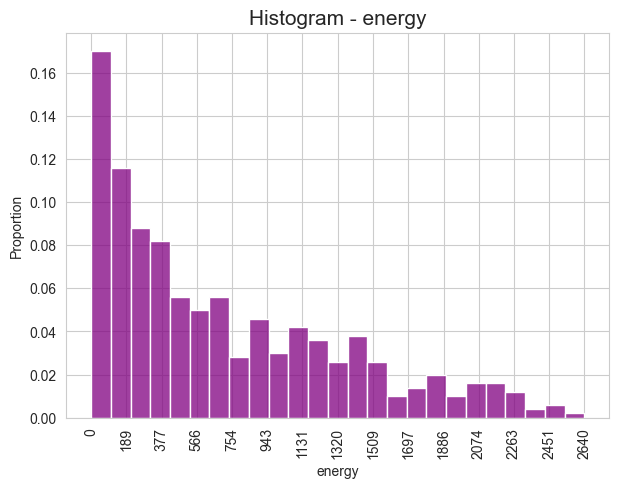

In [204]:
histogram(X=wind_df[response], bins=25, color='purple', figsize=(7,5), random=True, n=500, seed=123, x_rotation=90) 

#### **Frequencies**

In [205]:
response_cat = quant_to_cat(wind_df[response], rule='quartiles', n_intervals=4, random_seed=123)
freq_table(X=response_cat)


energy: unique values,abs_freq,rel_freq,cum_abs_freq,cum_rel_freq
object,i64,f64,i64,f64
"(-inf, 0.01]",19,0.004,19,0.004002
"(0.01, 144.17]",1170,0.2464,1189,0.250421
"(144.17, 466.34]",1186,0.2498,2375,0.500211
"(466.34, 1089.35]",1186,0.2498,3561,0.75
"(1089.35, 2792.55]",1187,0.25,4748,1.0


#### **Boxplot**

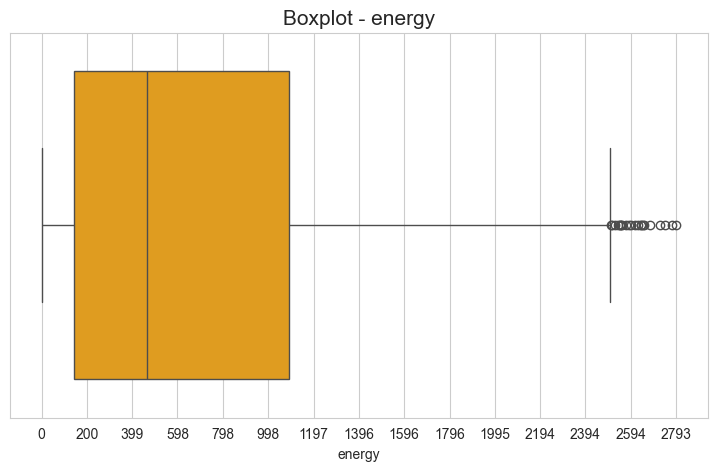

In [206]:
boxplot(X=wind_df[response], color='orange', figsize=(9,5), n_xticks=15, x_rotation=0, statistics=False)

#### **ECDF-plot**

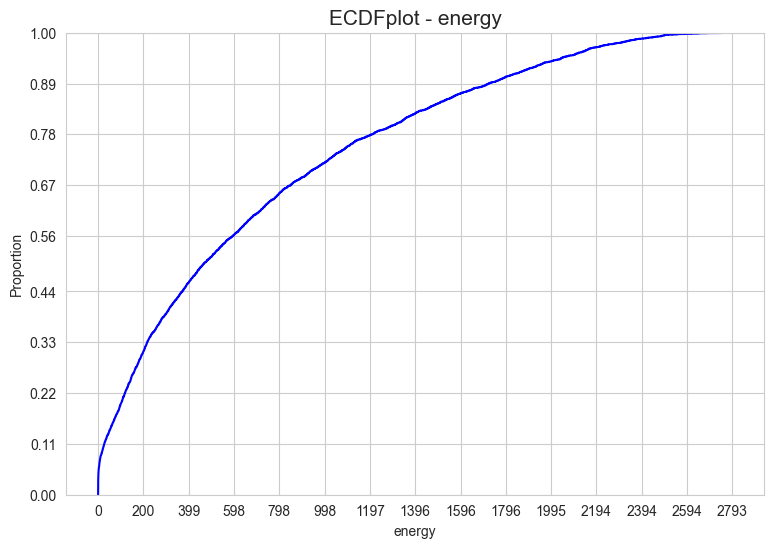

In [207]:
ecdfplot(X=wind_df[response], color='blue', figsize=(9,6))

#### **Outliers**

In [208]:
outliers_table(df=wind_df, auto=False, col_names=[response])

quant_variables,lower_bound,upper_bound,n_outliers,n_not_outliers,prop_outliers,prop_not_outliers
str,f64,f64,i64,i64,f64,f64
"""energy""",-1273.6,2507.12,22,4726,0.004634,0.995366


In [ ]:
'''
cv_energy = np.std(wind_data.energy.to_numpy()) / np.mean(wind_data.energy.to_numpy())
print(f'Coefficient of variance energy produced: {100*cv_energy:.4f}%')
'''

Coefficient of variance energy produced: 96.01%


The response has a very high coefficient of variance (> 96%). Around 50% of the observations have an energy production of 500 or less, and the other half take values up to 2800. With a high coefficient of variance, if we apply RMSE  our models will be very influenced by these extreme values.



#### **Time series analysis**


##### **Autocorrelation**

Next, we know that our response has been measured everyday at 4 different moments every 6 hours. We are going to analyze if there is correlation between the response and it's lag. We expect some because the response depends on several meteorological events, and during a day it can vary a lot, but, usually, if there are high winds at a given hour, most probably there will be at t + 6 hours.

In [ ]:
'''
def correct_hour_day_month(x):
    return f'0{x}' if len(x) == 1 else f'{x}'

wind_data.hour = wind_data.hour.astype(str)
wind_data.day = wind_data.day.astype(str)
wind_data.month = wind_data.month.astype(str)
wind_data.year = wind_data.year.astype(str)

wind_data['hour_corrected'] = wind_data.hour.apply(correct_hour_day_month)
wind_data['day_corrected'] = wind_data.day.apply(correct_hour_day_month)
wind_data['month_corrected'] = wind_data.month.apply(correct_hour_day_month)

wind_data['fecha'] = wind_data.apply(lambda row: pd.to_datetime(f'{row.day_corrected}-{row.month_corrected}-{row.year} {row.hour_corrected}:00', format='%d-%m-%Y %H:%M'), axis=1)
wind_data = wind_data.drop(['month', 'day', 'hour'], axis=1)

wind_data = wind_data.sort_values(by='fecha')
wind_data['energy_lag'] = wind_data['energy'].shift()

# Create a scatter plot
plt.scatter(wind_data['energy'].iloc[1:], wind_data['energy_lag'].iloc[1:])
plt.xlabel('Energy')
plt.ylabel('Energy Lag')
plt.title('Energy production vs its preceding observation')
plt.show()

print('Linear correlation Energy vs lag: {:.4f}'.format(wind_data["energy"].iloc[1:].corr(wind_data["energy_lag"].iloc[1:])))
wind_data = wind_data.drop('energy_lag', axis=1)
'''

<img src="plots/time_series_autocorr.png" width="500" height="auto">


The linear correlation is obvious. This will affect the way we do the inner and outer evaluation of the models as we can't use random sampling because our model would return overconfident test performance metrics and the selection of hyperparameters would be done with a bias.


#### **Statistics by year**

Next, in order to decide how to do the inner and outer evaluation, we are going to analyze the timeserie of the response. First we want to look at the years. The idea is to check if all follow a similar distribution and count the number of observations. Second, we want to look at the months to see if the amount of energy produced is independent of the month or not.

In [ ]:
'''
# Statistics for each year
energy_stats_by_year = wind_data.groupby('year')['energy'].describe()
print(energy_stats_by_year)
'''

In [ ]:
'''
# OUTPUT
       count        mean         std   min       25%      50%        75%  \
year                                                                       
2005  1256.0  718.697078  669.357880  0.01  173.1775  515.745  1098.3100   
2006  1272.0  635.094505  656.110591  0.01   97.8425  393.630   999.6725   
2007  1121.0  707.736753  653.687550  0.01  160.1400  476.100  1131.9600   
2008   178.0  829.901685  738.224964  0.02  155.2150  613.125  1443.2225   
2009   921.0  694.184886  667.122141  0.01  156.9100  467.030  1060.9700   

          max  
year           
2005  2774.89  
2006  2552.41  
2007  2547.09  
2008  2363.49  
2009  2792.55
'''

In [ ]:
'''
# ANOVA for '05, '06 an d'07
f_statistic, p_value = stats.f_oneway(energy_stats_by_year[energy_stats_by_year.index.isin(['2005', '2006', '2007'])]['mean'], energy_stats_by_year[energy_stats_by_year.index.isin(['2005', '2006', '2007'])]['std'], energy_stats_by_year[energy_stats_by_year.index.isin(['2005', '2006', '2007'])]['count'])

alpha = 0.01
if p_value < alpha:
    print(f"Reject the null hypothesis. There is a significant difference in means for 2005, 2006 and 2007.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in means for 2005, 2006 and 2007.")
'''

Reject the null hypothesis. There is a significant difference in means for 2005, 2006 and 2007.


In [ ]:
'''
# Plot the timeserie of each year

years = range(2005, 2010)
wind_data_years = [wind_data[(wind_data['fecha'] >= pd.to_datetime(f'{year}-01-01')) & (wind_data['fecha'] < pd.to_datetime(f'{year + 1}-01-01'))] for year in years]
max_energy = max(data['energy'].max() for data in wind_data_years) + 200 # Get the max to fix the y_lim range in all plots

fig, axes = plt.subplots(2, 3, figsize=(16, 8))
for ax, data, year in zip(axes.flatten(), wind_data_years, years):
    ax.scatter(data['fecha'], data['energy'])
    ax.set_title(f'Year {year}')
    ax.set_ylim(0, max_energy)

axes[1, 2].axis('off') # Hide empty subplot
plt.tight_layout()
plt.show()
'''

<img src="plots/time_series_1.png" width="1100" height="auto">


The plots and statistics reveal several things:
- We have a smaller sample for 2008 and 2009, especially 2008 (178 observations)
- Altough the ANOVA test for '05, '06 and '07 has revealed evidence that the means are different, the distributions are similar if we look at the quantiles
- Some years have a smaller sample of data in certain months
- 2008 has data only until February
- 2009 has no data before March and the last two months of the year have very high mean and median

With this, we know that we have to be careful when partitioning the years for training, testing and validation because we could end up validating and/or testing on years with no data for a given month, thus, introducing a bias.

Next, we look at the months.

In [ ]:
'''
# Distribution of Energy for each month in 2009
wind_data[(wind_data['fecha'] >= pd.to_datetime(f'2009-01-01')) & (wind_data['fecha'] < pd.to_datetime(f'2010-01-01'))].groupby('month_corrected')['energy'].describe()
'''

<img src="plots/time_series_3.png" width="650" height="auto">


In [ ]:
'''
# Statistics per month
energy_stats_by_month = wind_data.groupby('month_corrected')['energy'].describe()
print(energy_stats_by_month)
'''

In [ ]:
'''
# OUTPUT
                 count        mean         std   min       25%      50%  \
month_corrected                                                           
01               414.0  769.640459  706.303381  0.01  150.8850  537.290   
02               373.0  786.625228  681.911100  0.02  164.8400  592.520   
03               306.0  919.219150  748.412370  0.02  213.8775  774.600   
04               413.0  599.231671  583.613640  0.01  147.0100  409.530   
05               426.0  641.243310  626.290574  0.02  131.8125  415.400   
06               357.0  544.173754  572.353719  0.01  103.2300  321.130   
07               384.0  423.834323  486.443940  0.01   63.9275  206.095   
08               440.0  506.656523  510.917812  0.01   98.7075  359.645   
09               368.0  548.853288  556.973683  0.02  117.0850  351.715   
10               412.0  669.815024  628.326946  0.01  145.1450  494.800   
11               432.0  981.925069  767.750402  0.01  286.9400  792.305   
12               423.0  933.576738  766.851606  0.01  262.0750  754.500   

                       75%      max  
month_corrected                      
01               1305.3700  2492.47  
02               1309.7100  2508.97  
03               1584.8550  2574.03  
04                909.3300  2610.74  
05               1066.1825  2536.88  
06                845.1900  2586.51  
07                671.9600  2415.42  
08                734.7050  2214.61  
09                839.7450  2344.45  
10               1023.1700  2495.43  
11               1571.6550  2745.86  
12               1533.1950  2792.55
'''

In [ ]:
'''
plt.figure(figsize=(10, 6))
plt.plot(energy_stats_by_month.reset_index()['month_corrected'], energy_stats_by_month['mean'], marker='o', linestyle='-', color='b')

plt.xlabel('Month')
plt.ylabel('Mean Energy Produced')
plt.title('Mean Energy Produced Each Month')
plt.grid(True)
plt.show()
'''

<img src="plots/time_series_2.png" width="700" height="auto">


In [ ]:
''' 
# ANOVA by month
f_statistic, p_value = stats.f_oneway(energy_stats_by_month['mean'], energy_stats_by_month['std'], energy_stats_by_month['count'])

alpha = 0.01  
if p_value < alpha:
    print(f"Reject the null hypothesis. There is a significant difference in the means of each month.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in the means of each month.")

'''

Reject the null hypothesis. There is a significant difference in the means of each month.


The energy produced is not independent of the month. March, November and December seem to be the ones when the most energy is produced. This is very important because it is telling us that when training and testing, we should do it with full years, or at least, having data from all months. Also, we have to account for the autocorrelation of the response so that no random sampling is allowed. 

Having years with no data in some months, and other years with a much smaller sample of data suggests that k-fold crossvalidation has to be taken with ease, specially when $k$ big because we could end up training with no data for some months, or testing with missing months and other scenarios that can be biased and non-robust estimations of future performance and best hyperparameters.

Last, we look at the distribution of energy produced by the 4 different hours that we have.

In [ ]:
'''
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
hour_values = wind_data.hour_corrected.unique().tolist()

for hour, ax in zip(hour_values, axes.flatten()):
    subset = wind_data[wind_data['hour_corrected'] == hour]
    ax.hist(subset['energy'], bins=20, edgecolor='black', density=True)
    ax.set_title(f'Hour - {hour}')
    ax.set_xlabel('Energy')
    ax.set_ylabel('Density')
    ax.set_ylim(0, 0.0022)

plt.tight_layout()
plt.show()
'''

<img src="plots/time_series_4.png" width="700" height="auto">


The energy production seems to be independent of the hour of the day.

### **Analysis of relationship between Response and Predictors**

In this section we are going to analyze the correlation between the response an the predictors, as well as between the predictors itself. All of the are quantitative, therefore we will use the Pearson linear correlation coefficient to measure this.

Since we have a set of predictors per location, we will be focus in one of them, for example Sotavento location (13).

After that we will explore if there are significative differences in these correlation depending on the location.

In [209]:
num_locations = 25
predictors_location = dict()
for j in range(0, num_locations):
    predictors_location[j+1] = [x for x in wind_df[predictors].columns if re.search(rf'\.{j+1}(?![0-9])', x)]

predictors_not_loc = [x.rsplit('.', 1)[0] for x in predictors_location[1]]

In [210]:
corr_matrix_loc = dict()
for j in range(0, num_locations):
    corr_matrix_loc[j+1] = corr_matrix(df=wind_df[[response] + predictors_location[j+1]], auto_col=True, method='pearson')
    corr_matrix_loc[j+1].columns = [response] + predictors_not_loc
    corr_matrix_loc[j+1].index = [response] + predictors_not_loc

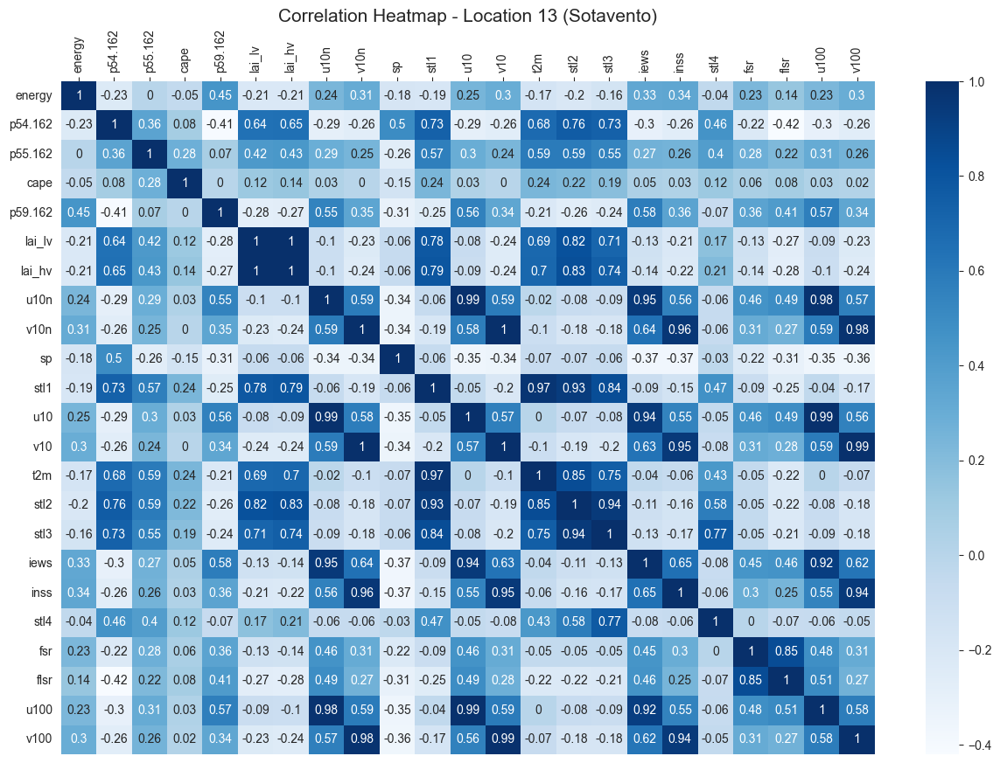

In [229]:
fig = plt.subplots(figsize=(15,10))
ax = sns.heatmap(corr_matrix_loc[13], cmap="Blues", annot=True)
ax.set(xlabel="", ylabel="")
ax.xaxis.tick_top()
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_xticklabels(), rotation=0)
plt.title(label = 'Correlation Heatmap - Location 13 (Sotavento)', fontsize=15)
#plt.savefig('Correlation_Heatmap_Location_13' + '.jpg', format='jpg', dpi=400)
plt.show()

Let's take a look to the correlation between response a predictors with more detail:

In [213]:
corr_loc = dict()
for j in range(0, num_locations):
    corr_loc[j+1] = corr_matrix(df=wind_df, response='energy', predictors=predictors_location[j+1], method='pearson')

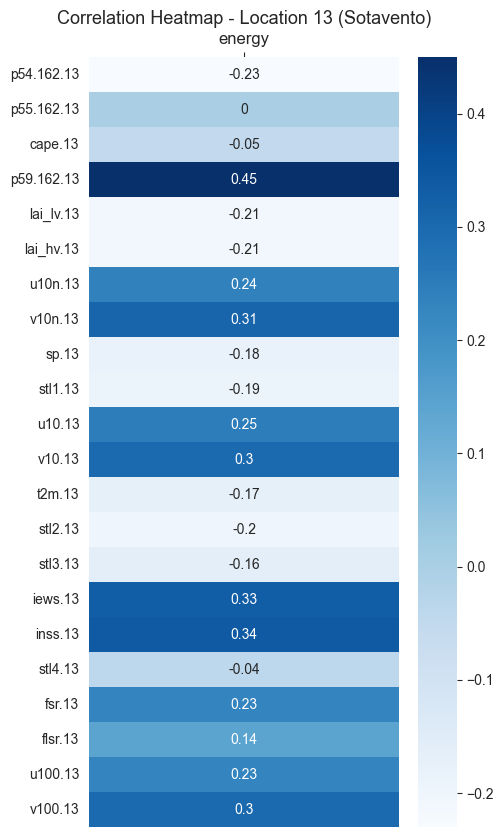

In [228]:
fig = plt.subplots(figsize=(5,10))
ax = sns.heatmap(corr_loc[13], cmap="Blues", annot=True)
ax.set(xlabel="", ylabel="")
ax.xaxis.tick_top()
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
plt.title('Correlation Heatmap - Location 13 (Sotavento)', fontsize=13)
#plt.savefig('Correlation_Heatmap_Location_13_response' + '.jpg', format='jpg', dpi=400)
plt.show()

Now we are going to analyze if there are differences in the correlation *between response and predictors* explained by the location.

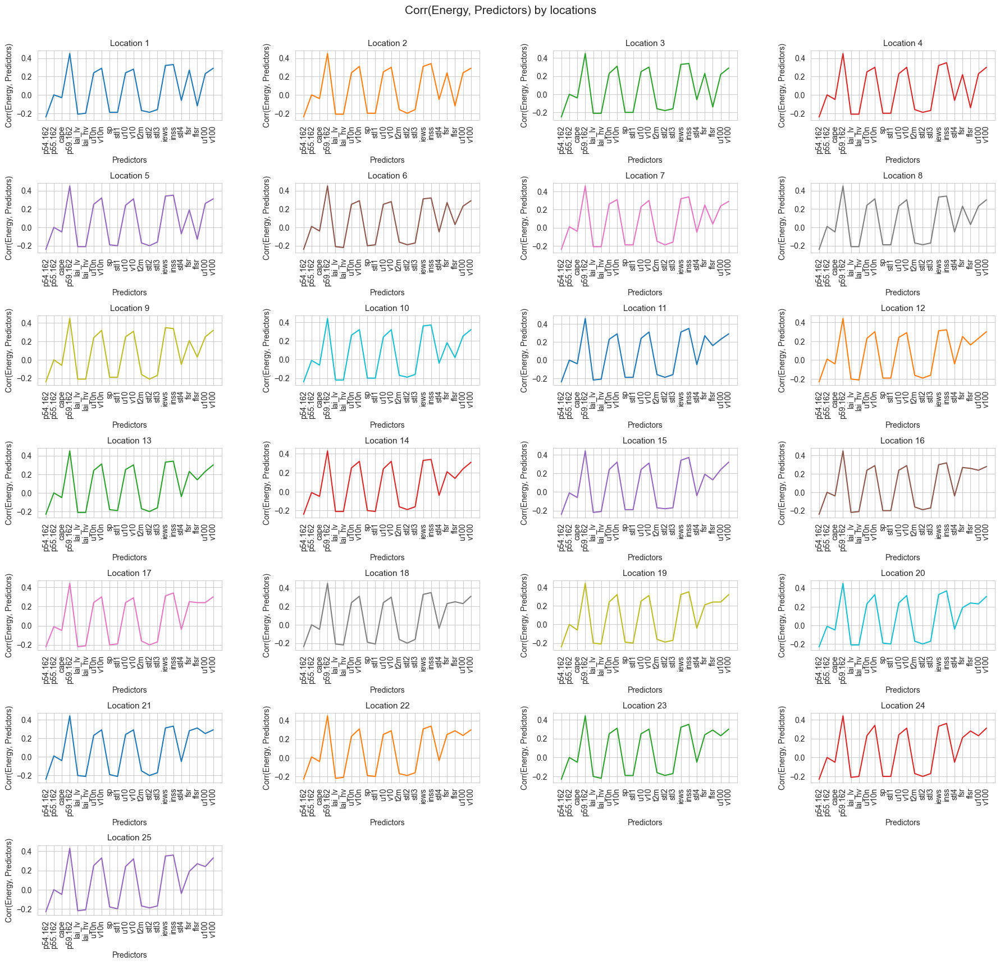

In [227]:
n_cols = 4
n_rows = int(np.ceil(num_locations/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22,20))
axes = axes.flatten() 
colors = sns.color_palette("tab10", num_locations)

for j, color in zip(range(0, num_locations), colors) :
    ax = axes[j] 
    sns.lineplot(y=corr_loc[j+1]['energy'].values, x=predictors_not_loc, ax=ax, color=color)
    ax.tick_params(axis='x', rotation=90)
    ax.set_title(f'Location {j+1}', fontsize=11)
    ax.set_xlabel('Predictors')
    ax.set_ylabel('Corr(Energy, Predictors)')

for j in range(num_locations, n_rows * n_cols):
    fig.delaxes(axes[j])

plt.suptitle('Corr(Energy, Predictors) by locations', fontsize=15, y=0.92)
    
plt.subplots_adjust(hspace=0.9, wspace=0.4) 

#fig.savefig('Corr(Energy, Predictors)_Locations' + '.jpg', format='jpg', dpi=400)

plt.show()

- The plot is pretty clear, there are no significant differences in the correlation between the response (`energy`) and the rest of predictors depending on the location.

Now we are going to do a similar analysis but to explore if there are differences in the correlation *between predictors* explained by the location.

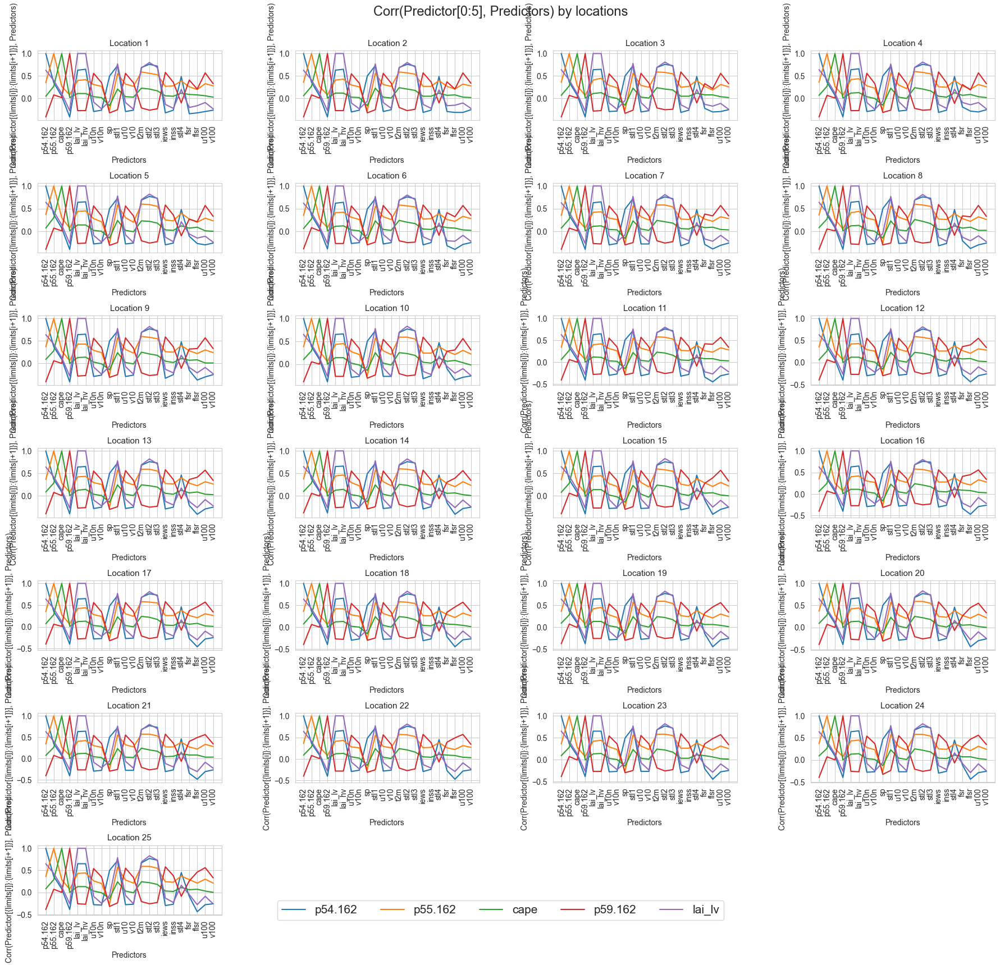

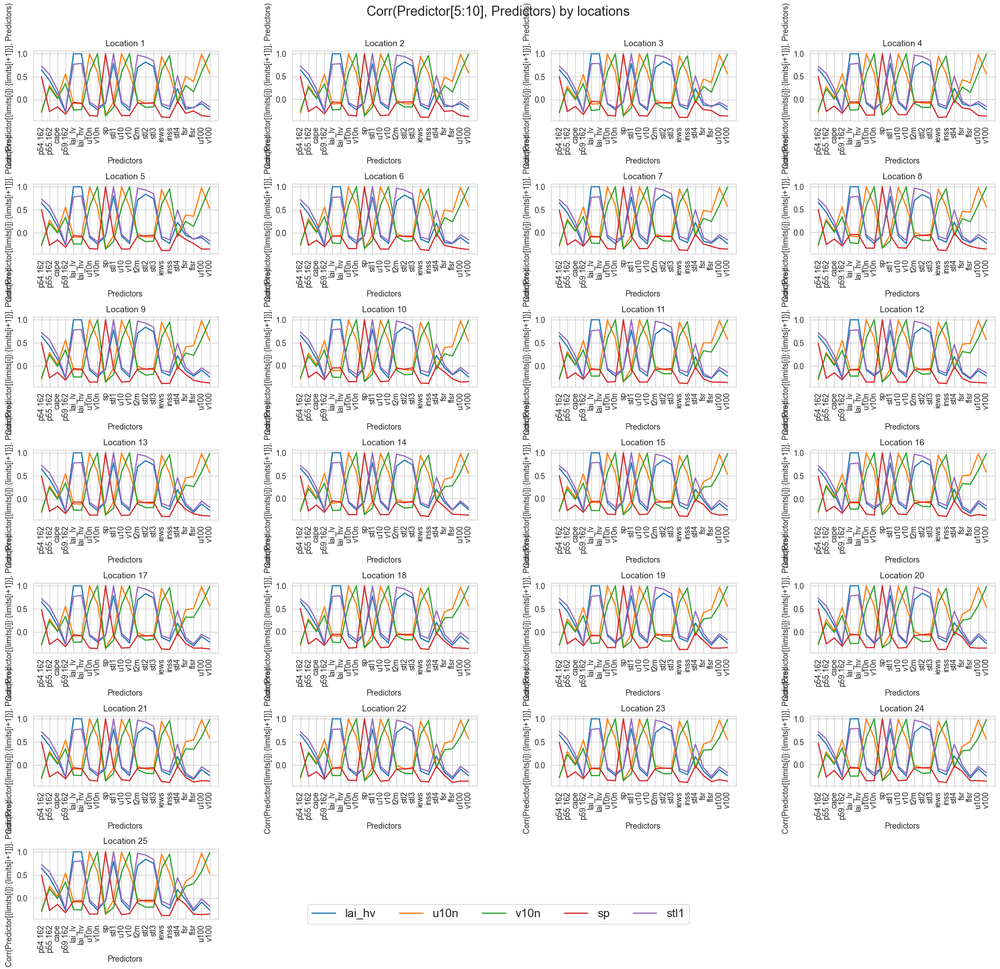

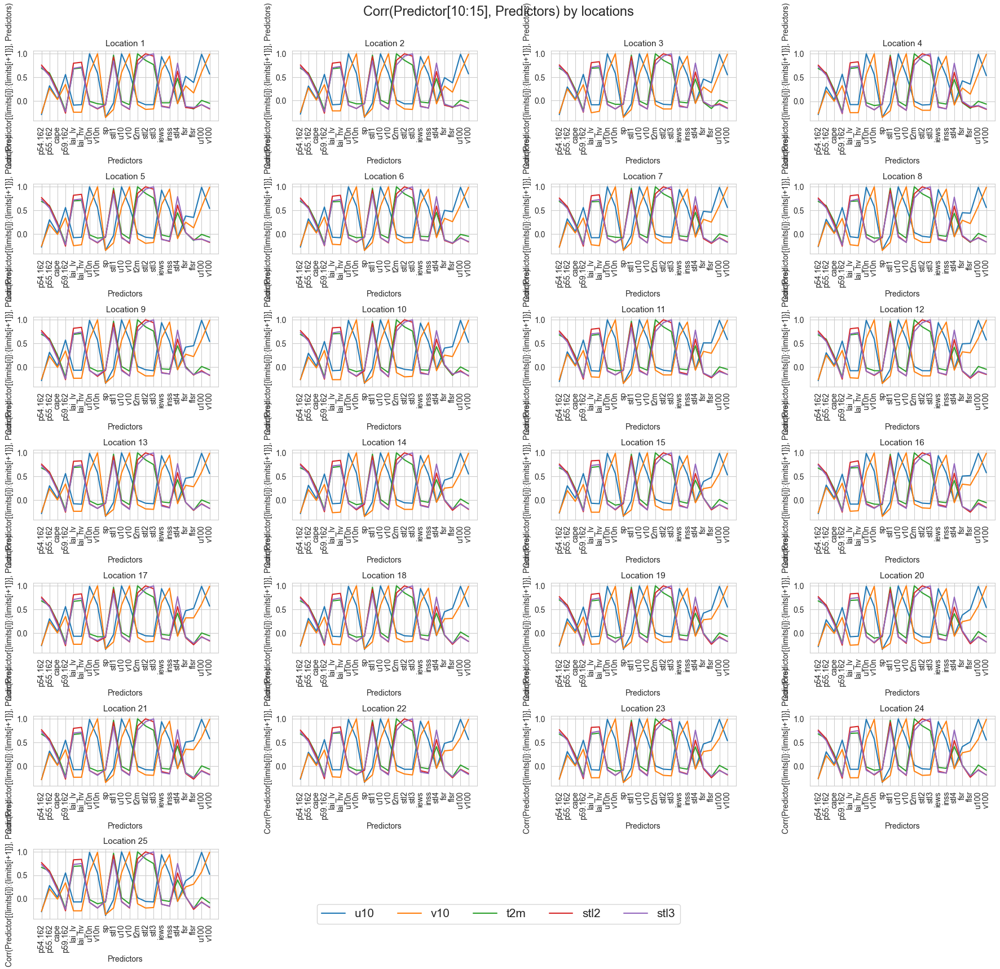

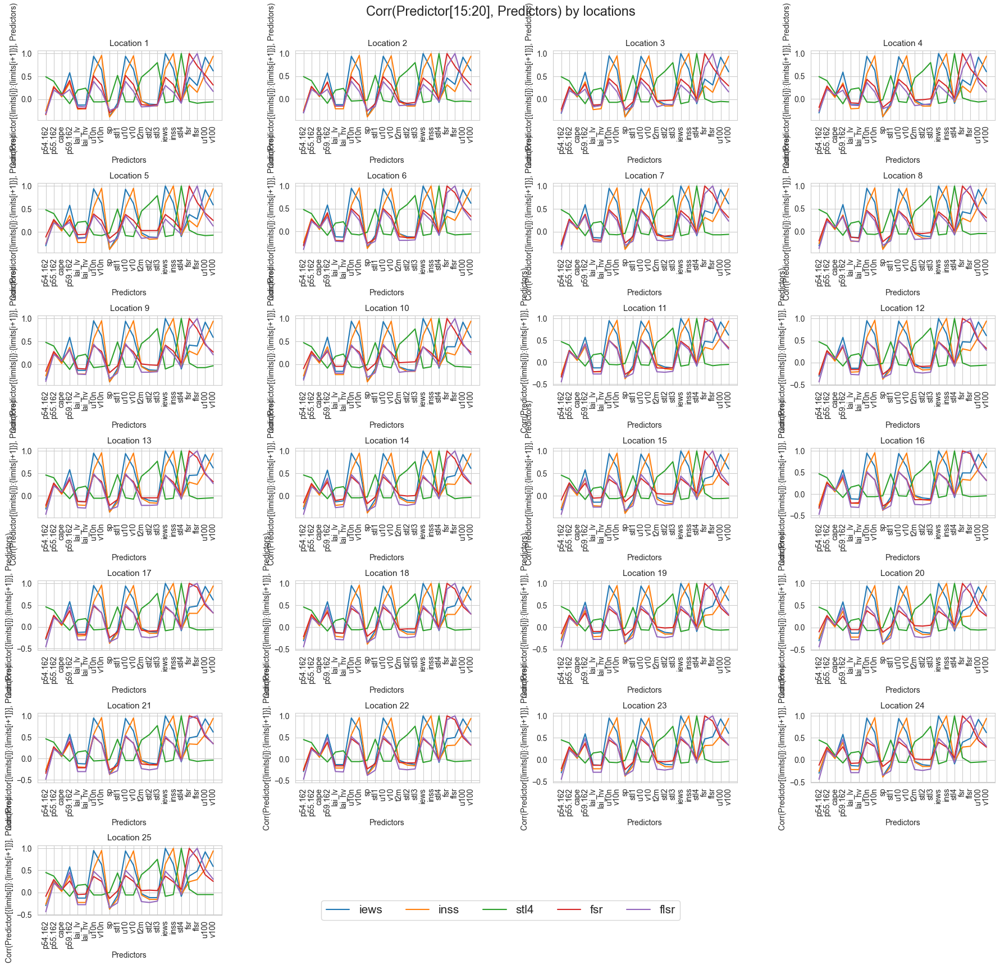

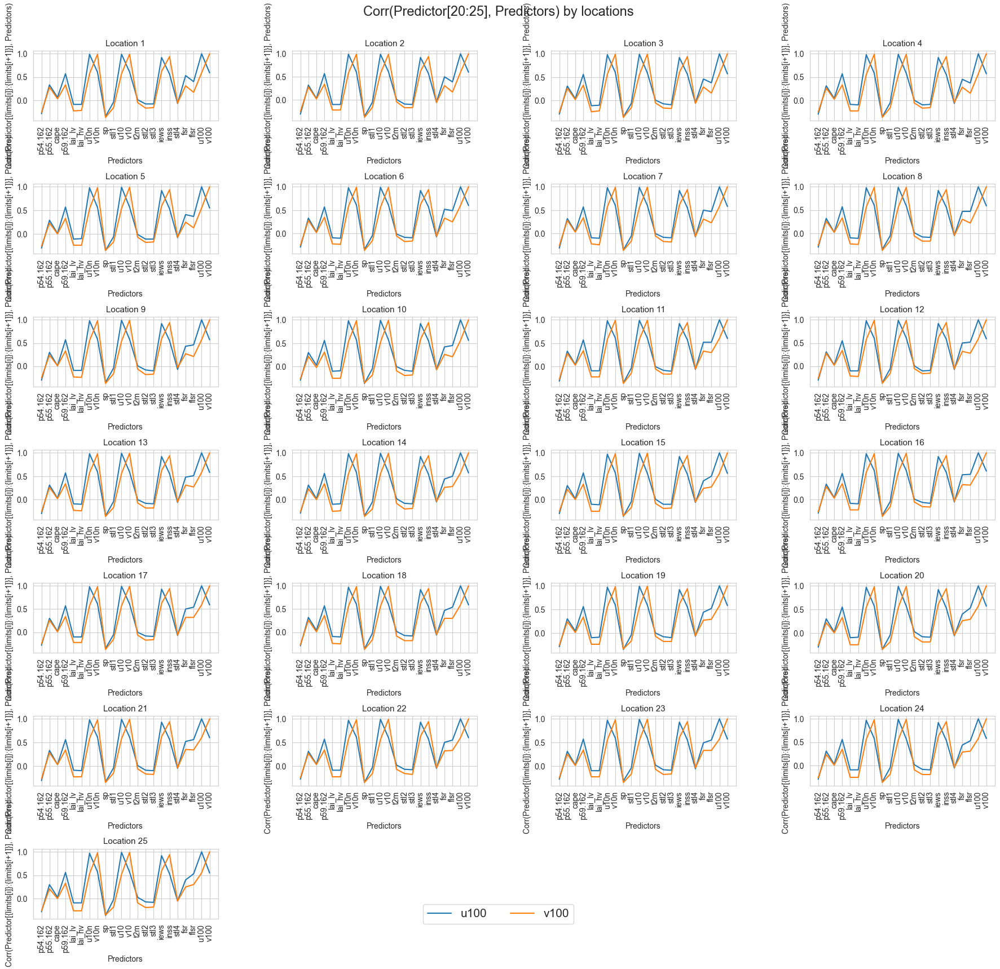

In [230]:
n_cols = 4
n_rows = int(np.ceil(num_locations/n_cols))

colors = sns.color_palette("tab10", num_locations)

limits = np.arange(0, len(predictors_not_loc) + 5, 5)

for i in range(0, len(limits)-1):

    subset_predictors = predictors_not_loc[limits[i]:limits[i+1]]

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(22,20))
    axes = axes.flatten() 
   
    for j in range(0, num_locations) :
        ax = axes[j] 
        for col, color in zip(subset_predictors, colors) :
            sns.lineplot(y=corr_matrix_loc[j+1][col][1:].values, x=predictors_not_loc, ax=ax, color=color, label=col)
        ax.tick_params(axis='x', rotation=90)
        ax.set_title(f'Location {j+1}', fontsize=11)
        ax.set_xlabel('Predictors')
        ax.set_ylabel('Corr(Predictor[{limits[i]}:{limits[i+1]}], Predictors)')
        ax.get_legend().remove()  # Remove individual subplot legends

    for j in range(num_locations, n_rows * n_cols):
        fig.delaxes(axes[j])

    plt.suptitle(f'Corr(Predictor[{limits[i]}:{limits[i+1]}], Predictors) by locations', fontsize=17, y=0.92)
    
    plt.subplots_adjust(hspace=0.9, wspace=0.4) 

    handles, labels = ax.get_legend_handles_labels() 
    fig.legend(handles, subset_predictors, loc='lower center', bbox_to_anchor=(0.5, 0.1), ncol=len(subset_predictors), fontsize=15)

    #fig.savefig(f'Corr(Predictor[{limits[i]}-{limits[i+1]}], Predictors)_Locations' + '.jpg', format='jpg', dpi=400)

    plt.show()

- As before, plots are very informative an illustrate that there are not significative difference in the correlation between response and predictors due to location.

### **EDA conclusions and things to take care of**

Some conclusions from all the previous results:
- We have a small dataset (4748 observations) and there is high dimensionality with a lot of missing cells. We can not afford to loose observations so data imputation is going to be crucial.

- The variable we want to predict, energy, has a very high right-skeewed distribution, but, tree-based models are robust to skeewed distributions. This may affect the metric we use (RMSE for instance).

- The response has autocorrelation and the energy produced depends on the month. This affects the type of validation and testing implentation. No random sampling allowed and we need to ensure having data from all months in trainning, validation and testing.

- There are years with missing data for certain months and 2008 has only 178 observations.

- The information obtained from the ECMWF web page suggests that we could create new variables and remove others.

- All variables are numeric.

- Lots of features with normal-ish distribution. But the ranges of the features vary a lot. For KNN it will be necessary to standarize.

- About the relations between the features and the response, there are some non-linear relations, but most of the graphs are distorted by the different scales, nothing clear in this point.

- As for the correlation between features, most of them seem to have very week positive or negative linear correlations meaning that they could have other type of relation or not at all. 
There are some packs of variables with very high positive correlation (>=0.9) suggesting that we could reduce the feature space in some way.

All of this will constraint how we design the validation and testing of our models. Also, gives us some ideas on how we could improve the performance of our models with scaling and some feature engineering and reduce dimensionality.

## **Train-Test Split**

In [ ]:
train_years = [2005, 2006, 2007]
test_years = [2008, 2009]

wind_df_train = wind_df.filter(pl.col('year').is_in(train_years))
wind_df_test = wind_df.filter(pl.col('year').is_in(test_years))

X = wind_df.select(predictors)
Y = wind_df[response]

X_train = wind_df_train.select(predictors)
Y_train = wind_df_train[response]

X_test = wind_df_test.select(predictors)
Y_test = wind_df_test[response]

X_years = wind_df['year'].to_numpy()
X_train_years = wind_df_train['year'].to_numpy()

## **Pipeline definition**

Initial functions from which we have been inspired to create the final pipeline.

In [25]:
'''
def only_wind(X, type) :
    
    if type == True : 
        wind_predictors = [x for x in X.columns if any(x.startswith(y) for y in ['u', 'v', 'wind', 'air'])]
        return X[wind_predictors]
    else :
        return X
'''

'''
def only_sotavento(X, type):
    
    predictors_location_13 = [x for x in X.columns if re.search(rf'\.{13}(?![0-9])', x)]
    if type == True :
        return X[predictors_location_13]
    else:
        return X 
'''

'''
def feature_engineering(X, type):
    
    if type == True :
        X = X.with_columns(np.sqrt(X['u10.13']**2 +X['v10.13']**2).alias('wind_speed.13'))
        X = X.with_columns(np.degrees(np.arctan2(X['v10.13'], X['u10.13'])).alias('wind_direction.13'))
        X = X.with_columns(((X['wind_direction.13'] + 360) % 360).alias('wind_direction.13'))
        X = X.with_columns((X['sp.13'] / (287 * X['t2m.13'])).alias('air_density.13'))
        return X
    elif type == False:
        return X
'''

<>:11: SyntaxWarning: invalid escape sequence '\.'
<>:11: SyntaxWarning: invalid escape sequence '\.'
C:\Users\fscielzo\AppData\Local\Temp\ipykernel_3436\2375949524.py:11: SyntaxWarning: invalid escape sequence '\.'
  '''


"\ndef feature_engineering(X, type):\n    \n    if type == True :\n        X = X.with_columns(np.sqrt(X['u10.13']**2 +X['v10.13']**2).alias('wind_speed.13'))\n        X = X.with_columns(np.degrees(np.arctan2(X['v10.13'], X['u10.13'])).alias('wind_direction.13'))\n        X = X.with_columns(((X['wind_direction.13'] + 360) % 360).alias('wind_direction.13'))\n        X = X.with_columns((X['sp.13'] / (287 * X['t2m.13'])).alias('air_density.13'))\n        return X\n    elif type == False:\n        return X\n"

Now we are going to define several transformers to include in our pipeline.

The following transformer performs imputation through different imputation methods, when it is activate.

In [ ]:
class imputation(BaseEstimator, TransformerMixin):

    def __init__(self, method='no_imputation'):
        self.method = method

    def fit(self, X, y=None):
               
        if self.method == 'no_imputation':
            self.imputer = None        
        elif self.method in ['simple_mean', 'simple_median']:
            self.imputer = SimpleImputer(missing_values=np.nan, strategy=self.method.split('_')[1])
        elif self.method == 'knn':
            self.imputer = KNNImputer(n_neighbors=1, weights="uniform")
        elif self.method in ['iterative_mean', 'iterative_median']:
            self.imputer = IterativeImputer(initial_strategy=self.method.split('_')[1], n_nearest_features=4, max_iter=15, random_state=123)
        else:
            raise ValueError("Invalid method for imputation")
        
        if self.imputer is not None:
            self.imputer.fit(X)

        return self

    def transform(self, X):
        if self.imputer is not None:
            X_column_names = X.columns
            X = self.imputer.transform(X)
            X = pl.from_numpy(X)
            X.columns = X_column_names
        return X

The following transformer select the wind predictors from the given data-set when it is activate.

In [26]:
class only_wind(BaseEstimator, TransformerMixin):

    def __init__(self, apply=False):
        # Initialize with the parameter that decides whether to select wind features or not
        self.apply = apply

    def fit(self, X, y=None):
        # This transformer does not need to learn anything from the data, so the fit method just returns self
        return self

    def transform(self, X):

        if self.apply == True:
            wind_predictors = [x for x in X.columns if any(x.startswith(y) for y in ['u', 'v', 'wind', 'air'])]
            return X[wind_predictors]
        elif self.apply == False:
            return X

The following transformer select the Sotavento predictors from the given data-set when it is activate.

In [27]:
class only_sotavento(BaseEstimator, TransformerMixin):

    def __init__(self, apply=False):
        # Initialize with the parameter that decides whether to select wind features or not
        self.apply = apply

    def fit(self, X, y=None):
        # This transformer does not need to learn anything from the data, so the fit method just returns self
        return self

    def transform(self, X):

        if self.apply == True:
            predictors_location_13 = [x for x in X.columns if re.search(rf'\.{13}(?![0-9])', x)]
            return X[predictors_location_13]
        elif self.apply == False:
            return X 

The following transformer applies feature engineering to the given data-set when it is activate.


After doing some research we came up with a way to obtain wind speed and direction from our variables. Using the horizontal and vertical measurements of the wind we can obtain these new variables. 

Now, the question is if we need to create these new variables for the 3 types of wind measurements (al 10 meters, 100 meters and te anomalies with respect to the mean) or not. We looked at the dimensions of wind turbines in late 1990s and found that for wind turbines of 750 kw the typical height was 50m for the base and including the blades up to 70-75 meters. This suggests that it would be better to use the measurements at 100m rather than those at 10 meters. Also, a very important factor, the measurements of wind at 100 meters have less missing values. This is very important because this means less cells to impute and less potential noise added due to the imputation.

For these reasons we will perform the feature engineering with the wind measurements at 100m only.

In [28]:
class feature_engineering(BaseEstimator, TransformerMixin):

    def __init__(self, apply=False):
        # Initialize with the parameter that decides whether to select wind features or not
        self.apply = apply

    def fit(self, X, y=None):
        # This transformer does not need to learn anything from the data, so the fit method just returns self
        return self

    def transform(self, X):
   
        if self.apply == True :
            wind_to_drop = [col for col in X.columns if "u10." in col or "v10." in col or "u10n" in col or "v10n" in col]
            fsr_laihv_cape_to_drop = [col for col in X.columns if "fsr" in col or "lai_lv" in col or "cape" in col]
            stl_to_drop = [col for col in X.columns if "stl" in col]
            p_vars_only_sotavento = [col for col in X.columns if "p" in col and "162" in col and not col.endswith("13")]
            cols_to_drop = wind_to_drop + fsr_laihv_cape_to_drop + stl_to_drop + p_vars_only_sotavento
            cols_to_keep = [x for x in X.columns if x not in cols_to_drop]
            X = X[cols_to_keep]
            X = X.with_columns(np.sqrt(X['u100.13']**2 +X['v100.13']**2).alias('wind_speed.13'))
            X = X.with_columns(np.degrees(np.arctan2(X['v100.13'], X['u100.13'])).alias('wind_direction.13'))
            X = X.with_columns(((X['wind_direction.13'] + 360) % 360).alias('wind_direction.13'))
            return X
        elif self.apply == False:
            return X

Below, we create these new variables without imputation just to have some visual representation on how they aid in discriminating higher and lower values of the response. First we will plot both together and then with the variable *iews* that we know has direct impact in the flow of wind.

In [ ]:
'''
wind_data['windSpeed'] = wind_data.apply(lambda row: sqrt((row['u100.13']**2)+(row['v100.13']**2)), axis=1)
wind_data['wind_direction'] = np.degrees(np.arctan2(wind_data['v100.13'], wind_data['u100.13']))
wind_data['wind_direction'] = (wind_data['wind_direction'] + 360) % 360 # Convert to 360º scale

plt.scatter(wind_data['wind_direction'].iloc[1:], wind_data['windSpeed'].iloc[1:], c=wind_data['energy'].iloc[1:], cmap='viridis')
plt.xlabel('Wind direction (360º) sotavento')
plt.ylabel('Wind speed sotavento')
plt.title('Energy production vs features')

# Add colorbar for reference
cbar = plt.colorbar()
cbar.set_label('Energy')

plt.show()
'''

<img src="plots/feature_en_1.png" width="600" height="450">


The plot above suggets that higher wind speed tend to generate more energy, but this energy production is dependent on the wind direction. 

Looking at the wind's direction, when it blows from 100º-150º (North-West) very little energy is produced in general and the same happens when it blows in direction 250º-320º (South, South-East). Most of the high energy production observations appear with wind directions between 0º-90º (East, Nort-East, North), the first quadrant, and wind speeds of 8m/s or higher.

In [ ]:
'''
plt.scatter(wind_data['windSpeed'].iloc[1:], wind_data['iews.13'].iloc[1:], c=wind_data['energy'].iloc[1:], cmap='viridis')
plt.xlabel('Wind speed (m/s) sotavento')
plt.ylabel('IEWS sotavento')
plt.title('Energy production vs features')

# Add colorbar for reference
cbar = plt.colorbar()
cbar.set_label('Energy')

plt.show()
'''

<img src="plots/feature_en_2.png" width="600" height="450">


In [ ]:
'''
plt.scatter(wind_data['wind_direction'].iloc[1:], wind_data['iews.13'].iloc[1:], c=wind_data['energy'].iloc[1:], cmap='viridis')
plt.xlabel('Wind direction (360º) sotavento')
plt.ylabel('IEWS sotavento')
plt.title('Energy production vs features')

# Add colorbar for reference
cbar = plt.colorbar()
cbar.set_label('Energy')

plt.show()
'''

<img src="plots/feature_en_3.png" width="600" height="450">


Both plots above suggest that there is a non-linear relation between the turbulence factor on wind and the speed and direction of the wind. Seems like the new variables work well together and also with other variables in the dataset. Nevertheless, the relations are not cristal clear and there is some obvious noise in the data so we will include more variables in our future analysis.

We are going to remove these new variables because the idea is to add them after imputing the existing variables in a pipeline step.

### **Testing the pipeline**

In this section we are going to define several pipelines using the above transformers and we will test them, in order to make sure them work well.

In [30]:
pipeline = Pipeline([
    ('imputation', imputation()),
    ('feature_engineering', feature_engineering()),
    ('only_wind', only_wind()),
    ('only_sotavento', only_sotavento())
    ])

pipeline.set_params(imputation__method='simple_mean', feature_engineering__apply=True, only_wind__apply=False, only_sotavento__apply=False)

pipeline.fit(X=X_train)
pipeline.transform(X=X_train)

month,hour,p54.162.13,p55.162.13,p59.162.13,lai_hv.1,lai_hv.2,lai_hv.3,lai_hv.4,lai_hv.5,lai_hv.6,lai_hv.7,lai_hv.8,lai_hv.9,lai_hv.10,lai_hv.11,lai_hv.12,lai_hv.13,lai_hv.14,lai_hv.15,lai_hv.16,lai_hv.17,lai_hv.18,lai_hv.19,lai_hv.20,lai_hv.21,lai_hv.22,lai_hv.23,lai_hv.24,lai_hv.25,sp.1,sp.2,sp.3,sp.4,sp.5,sp.6,sp.7,…,u100.16,u100.17,u100.18,u100.19,u100.20,u100.21,u100.22,u100.23,u100.24,u100.25,v100.1,v100.2,v100.3,v100.4,v100.5,v100.6,v100.7,v100.8,v100.9,v100.10,v100.11,v100.12,v100.13,v100.14,v100.15,v100.16,v100.17,v100.18,v100.19,v100.20,v100.21,v100.22,v100.23,v100.24,v100.25,wind_speed.13,wind_direction.13
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1.0,18.0,2.5108e6,9.186295,1.6275e6,2.336301,2.242958,2.239505,2.236064,2.232612,2.354674,2.351065,2.347445,2.343836,2.340227,2.440469,2.436726,2.432983,2.597243,2.425486,2.510131,2.506276,2.502422,2.498567,2.494724,2.537515,2.531817,2.526119,2.520421,2.706869,100691.101045,100414.200563,100137.300081,97860.970883,99583.499117,100548.40153,100261.734059,…,-2.104379,-1.952148,0.186532,-1.64821,-1.495979,-2.141521,-1.993476,-1.844907,-1.696861,-1.548292,-4.801839,-4.673119,-4.544897,-4.416176,-4.287456,-4.752946,0.093998,-4.488519,-4.355807,-4.223594,-4.715028,0.109453,-4.443617,-4.307911,-4.172206,-4.683596,0.094171,-4.407196,0.263704,-4.131295,-4.669626,-4.528932,-4.388736,-4.24854,-4.107846,4.78708,248.163973
1.0,0.0,2.5132e6,8.849569,1.1535e6,2.246332,2.242857,2.239371,2.235908,2.232422,2.354607,2.350953,2.347311,2.343669,2.340026,2.440391,2.436615,2.576445,2.429062,2.425285,2.510053,2.630269,2.502277,2.498389,2.494512,2.537448,2.654287,2.525985,2.690554,2.514522,100761.118941,100485.867431,100210.615921,99935.364411,99660.112902,98519.961799,98251.997369,…,-4.065591,0.216299,-3.742297,-3.580127,-3.41848,-4.06873,-3.908653,-3.748575,-3.588497,-3.42842,0.100978,0.058969,-3.166389,-3.034675,-2.902961,-3.416845,-3.28114,-3.145933,-3.010228,0.223252,-3.406368,-3.268168,-3.129469,-2.991269,-2.85257,-3.397886,-3.257192,-3.115998,-2.975304,-2.834609,-3.39639,-3.254198,-3.112506,-2.970314,0.235086,4.87916,219.895927
1.0,6.0,2.5096e6,15.910571,1.0988e6,2.246265,2.242756,2.239248,2.235751,2.232243,2.449854,2.467887,2.347177,2.343501,2.339825,2.440313,2.436503,2.432704,2.428883,2.425073,2.509963,2.506053,2.502131,2.49821,2.494299,2.53737,2.531605,2.52584,2.520075,2.706869,100599.392823,100328.834542,98131.777725,99787.717979,99517.159698,100455.044335,100174.719065,…,-5.395387,-5.220661,0.186532,-4.871211,0.241297,-5.333134,-5.162594,-4.992054,-4.821514,0.229127,-1.512977,-1.362803,-1.212629,-1.062455,-0.912281,-1.489029,-1.335363,-1.182195,-1.029028,0.223252,-1.469571,-1.313909,0.125493,-1.002086,0.233869,-1.454105,0.094171,-1.13829,0.263704,-0.822476,-1.459094,-1.302933,-1.147271,-0.99111,-0.834949,5.098747,178.589668
1.0,12.0,2.5106e6,6.922709,1.0760e6,2.246164,2.242622,2.239081,2.235539,2.231986,2.354428,2.350707,2.346998,2.343278,2.339568,2.539475,2.436358,2.432514,2.597243,2.424805,2.509863,2.505897,2.650852,2.669143,2.49402,2.537258,2.53146,2.525661,2.519851,2.514053,100498.424988,100231.291495,99964.158002,99697.02451,99429.891017,100355.218097,100078.317615,…,-4.611739,-4.511821,-4.412426,-4.312509,-4.213114,-4.539547,-4.442245,-4.344419,-4.247117,-4.149292,1.319376,1.435124,1.550374,1.666123,0.269064,1.292933,1.408682,1.523932,1.639182,1.754431,0.039669,1.387228,1.502478,1.617728,1.733477,1.255015,1.370265,1.485515,1.600765,1.716015,1.210612,1.319376,1.42814,1.536405,1.645169,4.744993,161.539851
1.0,18.0,2.5057e6,6.646282,1.0708e6,2.246097,2.242522,2.238947,2.235371,2.231807,2.35435,2.467887,2.346864,2.34311,2.339367,2.440134,2.436257,2.432369,2.597243,2.424604,2.509774,2.505785,2.501796,2.497796,2.493808,2.53718,2.53135

In [31]:
pipeline = Pipeline([
    ('imputation', imputation()),
    ('feature_engineering', feature_engineering()),
    ('only_wind', only_wind()),
    ('only_sotavento', only_sotavento()), 
    ('KNN', KNeighborsRegressor()) 
    ])

pipeline.set_params(imputation__method='simple_mean', feature_engineering__apply=True, only_wind__apply=False, only_sotavento__apply=False)

Pipeline(steps=[('imputation', imputation(method='simple_mean')),
                ('feature_engineering', feature_engineering(apply=True)),
                ('only_wind', only_wind()),
                ('only_sotavento', only_sotavento()),
                ('KNN', KNeighborsRegressor())])

In [32]:
pipeline.fit(X=X_train, y=Y_train)
pipeline.predict(X=X_test)

array([728.5  , 399.448, 762.706, ..., 576.422, 354.584, 531.466])

In [33]:
search = RandomizedSearchCV(estimator=pipeline, 
                            param_distributions={'KNN__n_neighbors': np.arange(200, 500, 10),
                                                 'KNN__metric': ['euclidean', 'cosine', 'cityblock', 'manhattan']},
                             cv=5, n_iter=10, random_state=123, scoring='neg_mean_absolute_error')

search.fit(X=X_train, y=Y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('imputation',
                                              imputation(method='simple_mean')),
                                             ('feature_engineering',
                                              feature_engineering(apply=True)),
                                             ('only_wind', only_wind()),
                                             ('only_sotavento',
                                              only_sotavento()),
                                             ('KNN', KNeighborsRegressor())]),
                   param_distributions={'KNN__metric': ['euclidean', 'cosine',
                                                        'cityblock',
                                                        'manhattan'],
                                        'KNN__n_neighbors': array([200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320,
       330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450,
       460, 470, 480, 490])},
                   random_state=123, scoring='neg_mean_absolute_error')

In [34]:
search.best_params_

{'KNN__n_neighbors': 220, 'KNN__metric': 'cityblock'}

In [35]:
search.best_score_

-484.6443784846776

## **Metric and Inner-Outer evaluation decision**

From the previous analysis we know that our response has autocorrelation, that te energy produced depends on the months, that some years are missing data on specific months, and that 2008 has only 178 observations and 2009 has no data before March. All this means that:
- We can not use random sampling for neither inner or outer evaluation.
- We have to make sure that we train and test using full years, or, at least, data from every month.
- Cross validation can introduce bias and return estimations of future performance that are not robust specially when using $k$ big.
- There are a lot of cells to impute and this step is going to be very important.
- Lots of variables means that the training will take longer if we use all of them. Probably we won't need to use all but first, we have been asked to check if this is the case.

Adding to the previous constraints, we've been asked to test a lot of things in this project, so a lot of computation is going to be required. In the next section we explain how we are going to tackle all these questions in a way that we can be confident of the results but we avoid excessive computation.



### **Inner-Outer evaluation**
So, we need to test a lot of things, take care of autocorrelation, and make sure that we have all 12 month in the inner and outer evaluation. For these reasons, we have decided to use simple train-test split both in inner and outer evaluation. This will allow us to iterate and respond to all questions a lot quicker at the spend of having some bias due to the simpler approach.

For testing, we will use 2008 + 2009. This way we have data for all months, in total we have 1099 observations (23.14%) and we avoid having years with lots of months missing in the training that can cause a lot of problems.

The inner will have also a simple train-test split with data from '05-'07. As said, we need to have data from all months to evaluate, so, if we choose a % of the data, i.e. 70%, we would be missing data from the first months (70% of 3 years is 2 years and a portion of the next). Also, the ANOVA test showed that when comparing the means of these 3 years we have evidences to say that they are different altough the distributions are very similar. For this reason, we wont use '06 for validation as it has the biggest difference with respect to the others, and we can not use '07 because it has some months missing. For these reasons we have to choose '05 for the validation and '06 and '07 for training.



### **Metric**
Last, to measure the accuracy of our models, we choose MAE (mean absolute error). We have 2 reasons to do this:
- First, because of the high dispersion of the response. Using RMSE would lead to give more importance to extreme values and we have a lot.
- Second, if we think about our task, we want to predict energy production so that the people in charge decide if it will be needed to produce more energy with other non-renewable sources. This means that we are more interested in measuring absolute error than squared error. I am convinced that there exists a threshold of energy production where it is not sufficient to satisfy the demand and other sources are needed. It would be very valuable to know this threshold because we could use a mixture of MAE and RMSE (or huber loss) in order to have RMSE for the values under the threshold and MAE for the ones above.



### **Type of problem**
Obviously, this problem is a regression one. We want to predict a continuous variable.

## **Predicting energy production**

Now, the main part of the assignment. We've been asked to develop a model to predict the energy produced at the sotavento wind farm and answer some questions:
- Is it necessary to use all 550 variables or is it enough to use only the ones for sotavento (location 13)?
- Can we use only the variables associated with the wind?
- Does imputation improve performance? If so, which method?
- Which type of model among KNN, trees and tree-based ensembles seems to work best?
- Does hyperparameter optimization improve performance? Comment on the methods implemented.
- After selecting the best model, which is the estimated future performance? Give an interpretation of the metrics used.
- Fit the final model and give predictions for the observations in the dataset *wind_competition.csv*.

There are several thing to test here. In order to answer the questions regarding imputation methods and feature importance, we are going to apply a global HPO on histogram gradient boosting, which can handle missing values. 

The idea is to perform this global HPO as a first step in order to carry out reduced and more efficient global HPO after that, more focused on obtaining the best model.

After answering these questions we will proceed to compare the different models (KNN, trees, 2 tree-based ensembles) with their HPO.


### **Model search (Model HPO)**

Utils to perform model search (HPO on model hyperparameters).

In [ ]:
class OptunaSearchCV:
    
    def __init__(self, estimator, param_grid, cv, score, n_iter, seed):

        self.estimator = estimator
        self.param_grid = param_grid
        self.cv = cv
        self.score = score
        self.n_iter = n_iter
        self.seed = seed

    def objective(self, trial, X, Y):
 
       self.estimator.set_params(**self.param_grid(trial))
       score = np.mean(cross_val_score(X=X, y=Y, estimator=self.estimator, scoring=self.score, cv=self.cv))
       return score 
    
    def fit(self, X,Y):
       
       sampler = optuna.samplers.TPESampler(seed=self.seed)
       direction = 'maximize' if 'neg' in self.score  else 'minimize'
       study = optuna.create_study(direction=direction, sampler=sampler)
       study.optimize(lambda trial: self.objective(trial, X=X, Y=Y), n_trials=self.n_iter) 
       self.best_params_ = study.best_params
       self.best_score_ = study.best_value   

In [ ]:
class search:
    
    def __init__(self, estimator=None, param_grid=None, cv_method=None, train_prop=0.75, n_folds=5, score='neg_mean_squared_error') :
        
        self.estimator = estimator
        self.param_grid = param_grid
        self.cv_method = cv_method
        self.train_prop = train_prop
        self.n_folds = n_folds
        self.score = score

    def fit(self, X, Y, search_method, n_iter=50, seed=123, X_years=None, years_training=None, years_testing=None) :

        if isinstance(Y, (pd.DataFrame, pl.DataFrame, pd.Series, pl.Series)):
            Y = Y.to_numpy().flatten()

        if self.cv_method == 'years_based':

            indices = []
            for x in X_years:
                if x in years_training: # train years
                    indices.append(-1) # -1 = train 
                elif x in years_testing: # test years
                    indices.append(0) # 0 = test
            cv = PredefinedSplit(indices)
        
        elif self.cv_method in ['random_simple_validation', 'not_random_simple_validation'] :
        
            n = len(X)
            n_train = round(self.train_prop*n)
            n_test = n - n_train
            train_indices = np.repeat(-1, n_train) # -1 = Train 
            test_indices = np.repeat(0, n_test)  # 0 = Test
            indices = np.concatenate((train_indices, test_indices))

            if self.cv_method == 'random_simple_validation':
               # To perform random simple validation we have to shuffle the indices
               np.random.seed(123)
               indices = np.random.choice(indices, len(indices), replace=False)
               cv = PredefinedSplit(indices)
               
            elif self.cv_method == 'not_random_simple_validation' :
                cv = PredefinedSplit(indices)
    
        elif self.cv_method == 'kfolds' :
            cv = self.n_folds

        if search_method == 'grid_search':
            search = GridSearchCV(estimator=self.estimator, param_grid=self.param_grid, cv=cv , scoring=self.score)

        elif search_method == 'random_search':
            search = RandomizedSearchCV(estimator=self.estimator, param_distributions=self.param_grid, cv=cv, 
                                                 n_iter=n_iter, random_state=seed, scoring=self.score)
        elif search_method == 'halving_search':            
            search = HalvingGridSearchCV(estimator=self.estimator, param_grid=self.param_grid, cv=cv, scoring=self.score, 
                                         factor=2, min_resources='exhaust', max_resources='auto')
            
        # BayesianSearchCV is not maintain anymore by sklearn team and doesn't work with the current version of Numpy due to np.int is depreciated.    
        #elif search_method == 'bayesian_search':
            #search = BayesSearchCV(estimator=estimator, search_spaces=self.param_grid, cv=cv, n_iter=n_iter, random_state=seed, scoring=self.score)

        elif search_method == 'optuna':
            search = OptunaSearchCV(estimator=self.estimator, param_grid=self.param_grid, cv=cv, 
                                    score=self.score, n_iter=n_iter, seed=seed)
        search.fit(X, Y)
          
        return search 

### **Global search (Global HPO)**

Utils to perform global HPO (HPO on both preprocessing elements and model hyperparameters).

In [38]:
class global_search :

    def __init__(self, model, preprocessing_grid, model_param_grid_search, model_param_random_search, model_param_halving_search, model_param_optuna, search_methods_grid, cv_method, train_prop=0.75, n_folds=5, score='neg_mean_squared_error', n_iter=10, seed=123, X_years=None, years_training=None, years_testing=None) :
        
        self.model = model
        self.preprocessing_grid = preprocessing_grid
        self.model_param_grid_search = model_param_grid_search
        self.model_param_random_search = model_param_random_search
        self.model_param_halving_search = model_param_halving_search
        self.model_param_optuna = model_param_optuna
        self.search_methods_grid = search_methods_grid
        self.cv_method = cv_method
        self.train_prop = train_prop 
        self.n_folds = n_folds
        self.score = score
        self.n_iter = n_iter
        self.seed = seed
        self.X_years = X_years
        self.years_training = years_training
        self.years_testing = years_testing

    def fit(self, X, Y) :
        
        model = self.model
        preprocessing_grid = self.preprocessing_grid
        model_param_grid_search = self.model_param_grid_search
        model_param_random_search = self.model_param_random_search
        model_param_halving_search = self.model_param_halving_search
        model_param_optuna = self.model_param_optuna
        search_methods_grid = self.search_methods_grid
        cv_method = self.cv_method
        train_prop = self.train_prop
        n_folds = self.n_folds
        score = self.score
        n_iter = self.n_iter
        seed = self.seed
        X_years = self.X_years
        years_training = self.years_training
        years_testing = self.years_testing

        params, score_values, search_methods, times = [], [], [], []
        preprocessing_search_space = list(product(preprocessing_grid['imputation'], preprocessing_grid['feature_engineering'], 
                                                  preprocessing_grid['only_sotavento'], preprocessing_grid['only_wind']))
        param_grid = {}
        param_grid['grid_search'] = model_param_grid_search 
        param_grid['random_search'] = model_param_random_search 
        param_grid['halving_search'] = model_param_halving_search 
        param_grid['optuna'] = model_param_optuna 
        
        
        for (imputation_, feature_engineering_, only_sotavento_, only_wind_), search_method in product(preprocessing_search_space, search_methods_grid) : 
            print('imputation:', imputation_, ', feature_engineering:', feature_engineering_, ', only_sotavento:', only_sotavento_, ', only_wind:', only_wind_, ', search_method:', search_method)

            start_time = time.time()
            
            # Pipeline
            pipeline = Pipeline([('imputation', imputation()),
                                 ('feature_engineering', feature_engineering()),
                                 ('only_wind', only_wind()),
                                 ('only_sotavento', only_sotavento()), 
                                 ('estimator', model) 
                                ])
            
            pipeline.set_params(imputation__method=imputation_, feature_engineering__apply=feature_engineering_,
                                 only_wind__apply=only_wind_, only_sotavento__apply=only_sotavento_)

            # Search - HPO
            search_ = search(estimator=pipeline, param_grid=param_grid[search_method],  
                             cv_method=cv_method, train_prop=train_prop, n_folds=n_folds, score=score)
            search_ = search_.fit(X, Y, search_method=search_method, n_iter=n_iter, seed=seed, 
                                  X_years=X_years, years_training=years_training, years_testing=years_testing)
            
            end_time = time.time()
            elapsed_time = end_time - start_time
            times.append(elapsed_time)
          
            params_dict = {'imputation': imputation_, 'feature_engineering': feature_engineering_,
                           'only_sotavento': only_sotavento_, 'only_wind': only_wind_}
            params_dict.update(search_.best_params_)
            params.append(params_dict)
            if score == 'neg_mean_squared_error':
                score_values.append(np.sqrt(-search_.best_score_))
            else:
                if 'neg' in score:
                    score_values.append(-search_.best_score_)
                else:
                    score_values.append(search_.best_score_)
            search_methods.append(search_method)

        best_params_ = params[np.argsort(score_values)[0]]
        best_score_ = np.min(score_values)
        results = pl.concat((pl.DataFrame(params), pl.DataFrame({'score': score_values, 
                                                                 'search_method':search_methods, 
                                                                 'time':times})), how='horizontal')
        if 'neg' in score:
            results = results.sort(by='score', descending=False)
        else:
            results = results.sort(by='score', descending=True)

        self.results= results
        self.best_params_ = best_params_
        self.best_score_ = best_score_

#### **Strategical test: Histogram Gradient Boosting**

In [67]:
preprocessing_grid = {'imputation': ['no_imputation', 'simple_median', 'iterative_mean', 'iterative_median'], 
                      'feature_engineering': [True, False], 
                      'only_sotavento': [True, False], 
                      'only_wind': [True, False]}

model_param_grid_search = {'estimator__max_depth': [2, 6, 9],
                             'estimator__l2_regularization': [0, 0.03, 0.2],
                             'estimator__learning_rate': [0.1, 0.3],
                             'estimator__max_iter': [100],
                             'estimator__max_leaf_nodes': [10, 30]}

model_param_halving_search = {'estimator__max_depth': [2, 4, 6, 9],
                             'estimator__l2_regularization': [0, 0.05, 0.7, 2],
                             'estimator__learning_rate': [0.1, 0.5, 1],
                             'estimator__max_iter': [120],
                             'estimator__max_leaf_nodes': [20, 50]}

model_param_random_search = {'estimator__max_depth': [1, 3, 4, 6, 9, 15, 25, 35],
                             'estimator__l2_regularization': [0, 0.03, 0.2, 0.5, 0.7, 1, 1.5, 2, 3, 4],
                             'estimator__learning_rate': [0.1, 0.2, 0.5, 0.7, 1],
                             'estimator__max_iter': [50, 75, 100, 140],
                             'estimator__max_leaf_nodes': [10, 20, 30, 50, 60]}


def model_param_optuna(trial):
    return {'estimator__max_depth': trial.suggest_int('estimator__max_depth', 1, 20),
            'estimator__l2_regularization': trial.suggest_float('estimator__l2_regularization', 0, 5, step=0.1, log=False),
            'estimator__learning_rate': trial.suggest_float('estimator__learning_rate', 0.1, 1, log=True),
            'estimator__max_iter':  trial.suggest_int('estimator__max_iter', 50, 250),
            'estimator__max_leaf_nodes': trial.suggest_int('estimator__max_leaf_nodes', 10, 75)}

search_methods_grid = ['grid_search', 'halving_search', 'random_search', 'optuna']

hgb_global_search_ = global_search(model=HistGradientBoostingRegressor(loss='squared_error', random_state=123),
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=model_param_grid_search,
                                   model_param_random_search=model_param_random_search,
                                   model_param_halving_search=model_param_halving_search, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=30, seed=666, 
                                   X_years=X_train_years, years_training=[2006, 2007], years_testing=[2005])

hgb_global_search_.fit(X_train, Y_train)
# Time; 445 mins

imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: grid_search
imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: halving_search
imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: random_search


[I 2024-01-05 01:18:11,388] A new study created in memory with name: no-name-a4c724a2-c134-4d78-b70d-f7a34df52e0c


imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: optuna


[I 2024-01-05 01:18:12,475] Trial 0 finished with value: -380.4713065359936 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -380.4713065359936.
[I 2024-01-05 01:18:12,527] Trial 1 finished with value: -341.92262224709714 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 1 with value: -341.92262224709714.
[I 2024-01-05 01:18:12,859] Trial 2 finished with value: -340.76399822624836 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -340.76399822624836.
[I 2024-01-05 01:18:13,135] Trial 3 finished with

imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: grid_search
imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: halving_search
imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: random_search


[I 2024-01-05 01:18:58,886] A new study created in memory with name: no-name-c9c62454-0eab-4c28-a567-84843b25b457


imputation: no_imputation , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: optuna


[I 2024-01-05 01:19:01,020] Trial 0 finished with value: -330.5467172379082 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -330.5467172379082.
[I 2024-01-05 01:19:01,087] Trial 1 finished with value: -335.10654401135673 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -330.5467172379082.
[I 2024-01-05 01:19:01,669] Trial 2 finished with value: -307.2418775286539 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -307.2418775286539.
[I 2024-01-05 01:19:02,070] Trial 3 finished with va

imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: grid_search
imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: halving_search
imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: random_search


[I 2024-01-05 01:20:23,969] A new study created in memory with name: no-name-34be8024-7d5d-4a47-8f24-0541cad99c8c


imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: optuna


[I 2024-01-05 01:20:28,653] Trial 0 finished with value: -318.50020785502085 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -318.50020785502085.
[I 2024-01-05 01:20:28,758] Trial 1 finished with value: -328.0024878542783 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -318.50020785502085.
[I 2024-01-05 01:20:29,886] Trial 2 finished with value: -308.7193720886919 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -308.7193720886919.
[I 2024-01-05 01:20:30,756] Trial 3 finished with 

imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: grid_search
imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: halving_search
imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: random_search


[I 2024-01-05 01:25:22,907] A new study created in memory with name: no-name-4521135f-6684-4975-a490-f99d560bb97f


imputation: no_imputation , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


[I 2024-01-05 01:25:38,656] Trial 0 finished with value: -318.17835428095196 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -318.17835428095196.
[I 2024-01-05 01:25:38,924] Trial 1 finished with value: -324.51332444502515 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -318.17835428095196.
[I 2024-01-05 01:25:43,636] Trial 2 finished with value: -295.570896297073 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -295.570896297073.
[I 2024-01-05 01:25:47,237] Trial 3 finished with v

imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: grid_search
imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: halving_search
imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: random_search


[I 2024-01-05 01:28:12,473] A new study created in memory with name: no-name-3b4e31b3-564a-446d-852f-c317202a7112


imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: optuna


[I 2024-01-05 01:28:13,674] Trial 0 finished with value: -357.91639907901 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -357.91639907901.
[I 2024-01-05 01:28:13,725] Trial 1 finished with value: -364.31050475393914 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -357.91639907901.
[I 2024-01-05 01:28:14,172] Trial 2 finished with value: -316.9034261145447 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -316.9034261145447.
[I 2024-01-05 01:28:14,473] Trial 3 finished with value: -

imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: grid_search
imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: halving_search
imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: random_search


[I 2024-01-05 01:29:09,687] A new study created in memory with name: no-name-44ee02c8-6c5c-4a59-b5f1-c287c4027c46


imputation: no_imputation , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: optuna


[I 2024-01-05 01:29:12,485] Trial 0 finished with value: -327.3373607071791 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -327.3373607071791.
[I 2024-01-05 01:29:12,539] Trial 1 finished with value: -354.0751626669407 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -327.3373607071791.
[I 2024-01-05 01:29:13,218] Trial 2 finished with value: -301.0889740621479 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -301.0889740621479.
[I 2024-01-05 01:29:13,722] Trial 3 finished with val

imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: grid_search
imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: halving_search
imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: random_search


[I 2024-01-05 01:32:13,369] A new study created in memory with name: no-name-e027b833-2551-45af-8ffe-bfd1777681bb


imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: optuna


[I 2024-01-05 01:32:24,288] Trial 0 finished with value: -330.7150788659398 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -330.7150788659398.
[I 2024-01-05 01:32:24,469] Trial 1 finished with value: -348.7808069216863 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -330.7150788659398.
[I 2024-01-05 01:32:27,291] Trial 2 finished with value: -307.9032606746272 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -307.9032606746272.
[I 2024-01-05 01:32:29,438] Trial 3 finished with val

imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: grid_search
imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: halving_search
imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: random_search


[I 2024-01-05 01:44:45,549] A new study created in memory with name: no-name-4a41b4f9-14f2-4f86-97aa-c7dd456e744d


imputation: no_imputation , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: optuna


[I 2024-01-05 01:45:23,621] Trial 0 finished with value: -310.11219193636674 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -310.11219193636674.
[I 2024-01-05 01:45:24,185] Trial 1 finished with value: -342.6909080201047 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -310.11219193636674.
[I 2024-01-05 01:45:36,282] Trial 2 finished with value: -297.1048513177818 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -297.1048513177818.
[I 2024-01-05 01:45:45,049] Trial 3 finished with 

imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: grid_search
imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: halving_search
imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: random_search


[I 2024-01-05 01:57:54,951] A new study created in memory with name: no-name-9b0bdc8e-c94c-4ea6-8193-8f53a63dfb9e


imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: optuna


[I 2024-01-05 01:57:56,099] Trial 0 finished with value: -379.9125396539067 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -379.9125396539067.
[I 2024-01-05 01:57:56,315] Trial 1 finished with value: -348.0501212486544 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 1 with value: -348.0501212486544.
[I 2024-01-05 01:57:56,801] Trial 2 finished with value: -338.59541133009856 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -338.59541133009856.
[I 2024-01-05 01:57:57,239] Trial 3 finished with v

imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: grid_search
imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: halving_search
imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: random_search


[I 2024-01-05 01:59:01,377] A new study created in memory with name: no-name-0c07f64a-f979-49e4-bb57-4bb6f8e91e8c


imputation: simple_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: optuna


[I 2024-01-05 01:59:03,448] Trial 0 finished with value: -333.61091928582846 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -333.61091928582846.
[I 2024-01-05 01:59:03,694] Trial 1 finished with value: -336.1986016274292 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -333.61091928582846.
[I 2024-01-05 01:59:04,387] Trial 2 finished with value: -307.70614184524953 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -307.70614184524953.
[I 2024-01-05 01:59:04,984] Trial 3 finished wit

imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: grid_search
imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: halving_search
imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: random_search


[I 2024-01-05 02:00:37,563] A new study created in memory with name: no-name-39f89257-5f18-48af-982b-b21ec4362d96


imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: optuna


[I 2024-01-05 02:00:41,145] Trial 0 finished with value: -339.9808767595907 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -339.9808767595907.
[I 2024-01-05 02:00:41,395] Trial 1 finished with value: -329.5315810154896 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 1 with value: -329.5315810154896.
[I 2024-01-05 02:00:42,598] Trial 2 finished with value: -308.7198461852897 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -308.7198461852897.
[I 2024-01-05 02:00:43,564] Trial 3 finished with val

imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: grid_search
imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: halving_search
imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: random_search


[I 2024-01-05 02:05:26,827] A new study created in memory with name: no-name-8cd04f1d-4cea-4340-8827-5416213dee93


imputation: simple_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


[I 2024-01-05 02:05:40,835] Trial 0 finished with value: -312.31549045686666 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -312.31549045686666.
[I 2024-01-05 02:05:41,231] Trial 1 finished with value: -322.4683693518262 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -312.31549045686666.
[I 2024-01-05 02:05:45,533] Trial 2 finished with value: -294.67746149018257 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -294.67746149018257.
[I 2024-01-05 02:05:49,133] Trial 3 finished wit

imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: grid_search
imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: halving_search
imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: random_search


[I 2024-01-05 02:08:19,581] A new study created in memory with name: no-name-06d90f26-3a5a-4a4c-ba8e-b1c24522f506


imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: optuna


[I 2024-01-05 02:08:20,784] Trial 0 finished with value: -358.46303380185736 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -358.46303380185736.
[I 2024-01-05 02:08:21,044] Trial 1 finished with value: -365.41162974920695 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -358.46303380185736.
[I 2024-01-05 02:08:21,584] Trial 2 finished with value: -313.2057527179668 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -313.2057527179668.
[I 2024-01-05 02:08:22,063] Trial 3 finished with

imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: grid_search
imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: halving_search
imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: random_search


[I 2024-01-05 02:09:35,797] A new study created in memory with name: no-name-31d5c443-2101-4ba4-b3f1-eea77d04805a


imputation: simple_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: optuna


[I 2024-01-05 02:09:38,583] Trial 0 finished with value: -329.56723902543223 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -329.56723902543223.
[I 2024-01-05 02:09:38,848] Trial 1 finished with value: -352.0385960581656 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -329.56723902543223.
[I 2024-01-05 02:09:39,615] Trial 2 finished with value: -310.3481596228649 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -310.3481596228649.
[I 2024-01-05 02:09:40,335] Trial 3 finished with 

imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: grid_search
imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: halving_search
imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: random_search


[I 2024-01-05 02:12:42,109] A new study created in memory with name: no-name-232895bd-6e5a-4f88-b63c-e6c10c3500de


imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: optuna


[I 2024-01-05 02:12:51,400] Trial 0 finished with value: -328.91192943475477 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -328.91192943475477.
[I 2024-01-05 02:12:51,759] Trial 1 finished with value: -347.8364692046256 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -328.91192943475477.
[I 2024-01-05 02:12:54,418] Trial 2 finished with value: -309.1546254813613 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -309.1546254813613.
[I 2024-01-05 02:12:56,577] Trial 3 finished with 

imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: grid_search
imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: halving_search
imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: random_search


[I 2024-01-05 02:24:36,175] A new study created in memory with name: no-name-26b3404c-4afb-490d-96d6-5f70805449a8


imputation: simple_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: optuna


[I 2024-01-05 02:25:09,558] Trial 0 finished with value: -308.65197960301595 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -308.65197960301595.
[I 2024-01-05 02:25:10,258] Trial 1 finished with value: -339.81071879956886 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is trial 0 with value: -308.65197960301595.
[I 2024-01-05 02:25:20,806] Trial 2 finished with value: -297.1966789701174 and parameters: {'estimator__max_depth': 5, 'estimator__l2_regularization': 3.7, 'estimator__learning_rate': 0.15591647337081602, 'estimator__max_iter': 190, 'estimator__max_leaf_nodes': 29}. Best is trial 2 with value: -297.1966789701174.
[I 2024-01-05 02:25:29,158] Trial 3 finished with

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 02:51:34,887] Trial 0 finished with value: -374.3452004558651 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -374.3452004558651.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 02:51:39,404] Trial 1 finished with value: -334.39030809592595 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is 

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 03:11:43,150] Trial 0 finished with value: -328.96892181681307 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -328.96892181681307.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 03:11:47,703] Trial 1 finished with value: -325.8528653043039 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 03:32:18,150] Trial 0 finished with value: -330.36796367001017 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -330.36796367001017.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 03:32:22,750] Trial 1 finished with value: -322.56239120684705 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best i

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 03:56:11,343] Trial 0 finished with value: -314.1306192020455 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -314.1306192020455.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 03:56:15,876] Trial 1 finished with value: -316.65116443167176 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is 

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 04:17:33,737] Trial 0 finished with value: -356.0042342921903 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -356.0042342921903.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 04:17:38,371] Trial 1 finished with value: -360.4688717716393 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is t

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 04:38:05,609] Trial 0 finished with value: -320.5924030870437 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -320.5924030870437.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 04:38:10,541] Trial 1 finished with value: -341.02489936839254 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is 

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 05:00:11,382] Trial 0 finished with value: -331.1739094686397 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -331.1739094686397.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 05:00:16,045] Trial 1 finished with value: -342.64011878161426 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is 

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_mean , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 05:29:39,376] Trial 0 finished with value: -310.5271616042461 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -310.5271616042461.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 05:29:44,479] Trial 1 finished with value: -334.3942462487129 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is t

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 05:55:29,440] Trial 0 finished with value: -373.12107251213706 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -373.12107251213706.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 05:55:33,806] Trial 1 finished with value: -330.9490301552488 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: True , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 06:15:41,353] Trial 0 finished with value: -329.45002748563104 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -329.45002748563104.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 06:15:46,050] Trial 1 finished with value: -323.34269295376373 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best i

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 06:36:42,183] Trial 0 finished with value: -327.6402553377888 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -327.6402553377888.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 06:36:46,803] Trial 1 finished with value: -318.5140962614982 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is t

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 07:00:33,914] Trial 0 finished with value: -323.38905437434715 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -323.38905437434715.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 07:00:38,745] Trial 1 finished with value: -313.2838723571142 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 07:22:14,125] Trial 0 finished with value: -349.74636751918865 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -349.74636751918865.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 07:22:18,825] Trial 1 finished with value: -359.7723860648598 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: True , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 07:42:38,256] Trial 0 finished with value: -325.1725262815667 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -325.1725262815667.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 07:42:42,938] Trial 1 finished with value: -341.6014156890614 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is t

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: True , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 08:05:01,653] Trial 0 finished with value: -317.6412341293308 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -317.6412341293308.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 08:05:06,401] Trial 1 finished with value: -343.94488483973856 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is 

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: grid_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: halving_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: random_search


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reache

imputation: iterative_median , feature_engineering: False , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 08:34:57,096] Trial 0 finished with value: -314.9719746750418 and parameters: {'estimator__max_depth': 15, 'estimator__l2_regularization': 4.3, 'estimator__learning_rate': 0.4748039638270473, 'estimator__max_iter': 196, 'estimator__max_leaf_nodes': 72}. Best is trial 0 with value: -314.9719746750418.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 08:35:02,274] Trial 1 finished with value: -334.9301241465792 and parameters: {'estimator__max_depth': 1, 'estimator__l2_regularization': 2.1, 'estimator__learning_rate': 0.11189554445691002, 'estimator__max_iter': 70, 'estimator__max_leaf_nodes': 43}. Best is t

In [68]:
hgb_global_search_.results

imputation,feature_engineering,only_sotavento,only_wind,estimator__l2_regularization,estimator__learning_rate,estimator__max_depth,estimator__max_iter,estimator__max_leaf_nodes,score,search_method,time
str,bool,bool,bool,f64,f64,i64,i64,i64,f64,str,f64
"""iterative_medi…",true,false,false,0.0,0.1,4,120,50,280.82337,"""halving_search…",791.365196
"""iterative_medi…",false,false,false,0.0,0.1,6,100,30,281.708733,"""grid_search""",342.778872
"""simple_median""",true,false,false,0.03,0.1,9,100,10,281.757864,"""grid_search""",79.814491
"""simple_median""",true,false,false,0.03,0.1,9,75,10,282.522898,"""random_search""",79.827537
"""simple_median""",true,false,false,5.0,0.100682,5,84,33,283.11109,"""optuna""",130.685306
"""no_imputation""",true,false,false,0.0,0.1,6,100,30,283.88077,"""grid_search""",84.90985
"""no_imputation""",true,false,false,0.5,0.1,4,75,50,284.401459,"""random_search""",85.438423
"""iterative_mean…",false,false,false,5.0,0.100685,7,129,49,284.406409,"""optuna""",526.531146
"""no_imputation""",true,false,false,0.0,0.1,4,120,20,284.573717,"""halving_search…",96.650337


In [69]:
hgb_global_search_.results.write_csv('results_hgb_pipeline.csv')

In [168]:
results_hgb_pipeline = pl.read_csv('results/results_hgb_pipeline_.csv')
results_hgb_pipeline.head(25)

imputation,feature_engineering,only_sotavento,only_wind,estimator__l2_regularization,estimator__learning_rate,estimator__max_depth,estimator__max_iter,estimator__max_leaf_nodes,score,search_method,time
str,bool,bool,bool,f64,f64,i64,i64,i64,f64,str,f64
"""iterative_medi…",true,false,false,0.0,0.1,4,120,50,280.82337,"""halving_search…",791.365196
"""iterative_medi…",false,false,false,0.0,0.1,6,100,30,281.708733,"""grid_search""",342.778872
"""simple_median""",true,false,false,0.03,0.1,9,100,10,281.757864,"""grid_search""",79.814491
"""simple_median""",true,false,false,0.03,0.1,9,75,10,282.522898,"""random_search""",79.827537
"""simple_median""",true,false,false,5.0,0.100682,5,84,33,283.11109,"""optuna""",130.685306
"""no_imputation""",true,false,false,0.0,0.1,6,100,30,283.88077,"""grid_search""",84.90985
"""no_imputation""",true,false,false,0.5,0.1,4,75,50,284.401459,"""random_search""",85.438423
"""iterative_mean…",false,false,false,5.0,0.100685,7,129,49,284.406409,"""optuna""",526.531146
"""no_imputation""",true,false,false,0.0,0.1,4,120,20,284.573717,"""halving_search…",96.650337


We can extract several conclusions for this global HPO:

- The amount of time to carry out a global HPO in this context is too much, in this case 445 mins (7.40 hours).

- Iterative and simple imputer are the best imputation methods, and is pretty clear that imputation improve performance. 

-  `feature_engineering = True`, `only_sotavento = False`, `only_wind = False` is the dominant combination. So, it is not necessary to use the 550 predictors, but is not enough with only the ones of Sotavento (location 13), neither only with wind predictors.

- HPO on model hyperparameters is a crucial step, since the model with fixed parameter is not usually the best version of the model, and in this case too.

- `optuna` and random search are powerful tools to perform HPO, since are efficient in terms of time and finding good combination of hyperparamiters. In many cases these are the best options, since the computational time of the alternatives is too much for practical scenarios.

Based on this results,, now we will reduced the next global HPO by setting `feature_engineering = True`, `only_sotavento = False`, `only_wind = False`, using `iterative_median` as imputation method, and only using `optuna` to make everything much faster.

These following test we will be done with five models: histogram gradien boosting, random forest, XGBoost, decision trees and KNN.

### **Reduced test: Histogram Gradient Boosting**

In [50]:
preprocessing_grid = {'imputation': ['iterative_median'], 
                      'feature_engineering': [True], 
                      'only_sotavento': [False], 
                      'only_wind': [False]}

def model_param_optuna(trial):
    return {'estimator__max_depth': trial.suggest_int('estimator__max_depth', 1, 15),
            'estimator__l2_regularization': trial.suggest_float('estimator__l2_regularization', 0, 0.5, step=0.1, log=False),
            'estimator__max_iter':  trial.suggest_int('estimator__max_iter', 30, 170),
            'estimator__max_leaf_nodes': trial.suggest_int('estimator__max_leaf_nodes', 2, 40)}

search_methods_grid = ['optuna']

hgb_global_search_ = global_search(model=HistGradientBoostingRegressor(loss='squared_error', learning_rate=0.1, random_state=123),
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=None,
                                   model_param_random_search=None,
                                   model_param_halving_search=None, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=100, seed=123, 
                                   X_years=X_train_years, years_training=[2006, 2007], years_testing=[2005])

hgb_global_search_.fit(X_train, Y_train)
# Time: 20  mins

[I 2024-01-05 14:33:58,270] A new study created in memory with name: no-name-68b16c8d-99c8-4e15-98c4-2c5a69f812a3


imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 14:34:09,794] Trial 0 finished with value: -280.1422340945018 and parameters: {'estimator__max_depth': 11, 'estimator__l2_regularization': 0.1, 'estimator__max_iter': 61, 'estimator__max_leaf_nodes': 23}. Best is trial 0 with value: -280.1422340945018.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 14:34:26,860] Trial 1 finished with value: -285.7671127291933 and parameters: {'estimator__max_depth': 11, 'estimator__l2_regularization': 0.2, 'estimator__max_iter': 168, 'estimator__max_leaf_nodes': 28}. Best is trial 0 with value: -280.1422340945018.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312

In [51]:
hgb_global_search_.results

imputation,feature_engineering,only_sotavento,only_wind,estimator__max_depth,estimator__l2_regularization,estimator__max_iter,estimator__max_leaf_nodes,score,search_method,time
str,bool,bool,bool,i64,f64,i64,i64,f64,str,f64
"""iterative_medi…",true,false,false,6,0.0,117,15,278.656682,"""optuna""",1195.173427


In [52]:
hgb_global_search_.results.write_csv('results_hgb_pipeline_2.csv')

In [169]:
results_hgb_pipeline_2 = pl.read_csv('results/results_hgb_pipeline_2.csv')
results_hgb_pipeline_2

imputation,feature_engineering,only_sotavento,only_wind,estimator__max_depth,estimator__l2_regularization,estimator__max_iter,estimator__max_leaf_nodes,score,search_method,time
str,bool,bool,bool,i64,f64,i64,i64,f64,str,f64
"""iterative_medi…",true,false,false,6,0.0,117,15,278.656682,"""optuna""",1195.173427


### **Reduced test: Trees**

In [53]:
preprocessing_grid = {'imputation': ['iterative_median'], 
                      'feature_engineering': [True], 
                      'only_sotavento': [False], 
                      'only_wind': [False]}

def model_param_optuna(trial):
    return {'estimator__min_samples_split': trial.suggest_int('estimator__min_samples_split', 2, 15), 
            'estimator__min_samples_leaf': trial.suggest_int('estimator__min_samples_leaf', 1, 15),
            'estimator__max_depth': trial.suggest_int('estimator__max_depth', 1, 9),
            'estimator__ccp_alpha': trial.suggest_float('estimator__ccp_alpha', 0.01, 1.5, log=True),
            'estimator__splitter': trial.suggest_categorical('estimator__splitter', ['best','random'])}

search_methods_grid = ['optuna']

tree_global_search_ = global_search(model=DecisionTreeRegressor(criterion='squared_error', random_state=123),
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=None,
                                   model_param_random_search=None,
                                   model_param_halving_search=None, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=100, seed=123, 
                                   X_years=X_train_years, years_training=[2006, 2007], years_testing=[2005])

tree_global_search_.fit(X_train, Y_train)
# Time: 15 mins

[I 2024-01-05 14:55:09,343] A new study created in memory with name: no-name-a6f23e9c-e6d0-4c56-9281-3822c31d2946


imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 14:55:19,754] Trial 0 finished with value: -343.8371140043545 and parameters: {'estimator__min_samples_split': 11, 'estimator__min_samples_leaf': 5, 'estimator__max_depth': 3, 'estimator__ccp_alpha': 0.1583839792421716, 'estimator__splitter': 'best'}. Best is trial 0 with value: -343.8371140043545.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 14:55:30,591] Trial 1 finished with value: -326.840571119597 and parameters: {'estimator__min_samples_split': 15, 'estimator__min_samples_leaf': 11, 'estimator__max_depth': 5, 'estimator__ccp_alpha': 0.07133185266396469, 'estimator__splitter': 'random'}. Best is t

In [54]:
tree_global_search_.results

imputation,feature_engineering,only_sotavento,only_wind,estimator__min_samples_split,estimator__min_samples_leaf,estimator__max_depth,estimator__ccp_alpha,estimator__splitter,score,search_method,time
str,bool,bool,bool,i64,i64,i64,f64,str,f64,str,f64
"""iterative_medi…",true,false,false,2,13,7,1.341984,"""random""",302.122604,"""optuna""",935.397144


In [55]:
tree_global_search_.results.write_csv('results_trees_pipeline.csv')

In [170]:
results_trees_pipeline = pl.read_csv('results/results_trees_pipeline.csv')
results_trees_pipeline

imputation,feature_engineering,only_sotavento,only_wind,estimator__min_samples_split,estimator__min_samples_leaf,estimator__max_depth,estimator__ccp_alpha,estimator__splitter,score,search_method,time
str,bool,bool,bool,i64,i64,i64,f64,str,f64,str,f64
"""iterative_medi…",true,false,false,2,13,7,1.341984,"""random""",302.122604,"""optuna""",935.397144


### **Reduced test: KNN**

Based in previous test: we will set feature_engineering = True, only_sotavento = False, only_wind = False, only use iterative_median as imputation methods, and modify (reduce) some model hyperparameters grids.

An to make the tests much faster we will only use optuna and random search.

In [59]:
preprocessing_grid = {'imputation': ['iterative_median'], 
                      'feature_engineering': [True], 'only_sotavento': [False], 'only_wind': [False]}


def model_param_optuna(trial):
    return {'estimator__n_neighbors': trial.suggest_int('estimator__n_neighbors', 1, 40), 
            'estimator__metric': trial.suggest_categorical('estimator__metric', ['euclidean','cosine','cityblock','manhattan'])}

search_methods_grid = ['optuna']

knn_global_search_ = global_search(model=KNeighborsRegressor(),
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=None,
                                   model_param_random_search=None,
                                   model_param_halving_search=None, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=100, seed=123, 
                                   X_years=X_train_years, years_training=[2006, 2007], years_testing=[2005])

knn_global_search_.fit(X_train, Y_train)
# Time:  15.38 mins

[I 2024-01-05 15:17:28,276] A new study created in memory with name: no-name-3da3dbb6-3849-4fe7-88fc-34764eaca869


imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 15:17:38,029] Trial 0 finished with value: -482.7414732142857 and parameters: {'estimator__n_neighbors': 28, 'estimator__metric': 'manhattan'}. Best is trial 0 with value: -482.7414732142857.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 15:17:47,153] Trial 1 finished with value: -490.0232938366429 and parameters: {'estimator__n_neighbors': 17, 'estimator__metric': 'euclidean'}. Best is trial 0 with value: -482.7414732142857.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not re

In [60]:
knn_global_search_.results

imputation,feature_engineering,only_sotavento,only_wind,estimator__n_neighbors,estimator__metric,score,search_method,time
str,bool,bool,bool,i64,str,f64,str,f64
"""iterative_medi…",true,false,false,30,"""manhattan""",481.232157,"""optuna""",938.841097


In [61]:
knn_global_search_.results.write_csv('results_knn_pipeline.csv')

In [171]:
results_knn_pipeline = pl.read_csv('results/results_knn_pipeline.csv')
results_knn_pipeline

imputation,feature_engineering,only_sotavento,only_wind,estimator__n_neighbors,estimator__metric,score,search_method,time
str,bool,bool,bool,i64,str,f64,str,f64
"""iterative_medi…",true,false,false,30,"""manhattan""",481.232157,"""optuna""",938.841097


### **Reduced test: XGboost**

In [96]:
preprocessing_grid = {'imputation': ['iterative_median'], 
                      'feature_engineering': [True], 
                      'only_sotavento': [False], 
                      'only_wind': [False]}

def model_param_optuna(trial):
    return {'estimator__n_estimators': trial.suggest_int('estimator__n_estimators', 5, 180),
            'estimator__max_depth': trial.suggest_int('estimator__max_depth', 1, 8),
            'estimator__eta': trial.suggest_float('estimator__eta', 0, 0.3, step=0.02, log=False),
            'estimator__alpha': trial.suggest_float('estimator__alpha', 0.2, 1, step=0.01, log=False),
            'estimator__lambda': trial.suggest_float('estimator__lambda', 1, 5, step=0.04, log=False),
            'estimator__subsample': trial.suggest_float('estimator__subsample', 0.3, 1, step=0.01, log=False),
            'estimator__reg_gamma': trial.suggest_float('estimator_gamma', 0, 7, step=0.05, log=False),
            'estimator__colsample_bytree': trial.suggest_float('estimator__colsample_bytree', 0.3, 1, step=0.02, log=False)}


search_methods_grid = ['optuna']

xgb_global_search_ = global_search(model=XGBRegressor(objective='reg:squarederror', booster='gbtree', random_state=123) ,
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=None,
                                   model_param_random_search=None,
                                   model_param_halving_search=None, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=200, seed=123, 
                                   X_years=X_train_years, years_training=[2006, 2007], years_testing=[2005])

xgb_global_search_.fit(X_train, Y_train)
# Time: 34 mins

[I 2024-01-05 16:20:20,134] A new study created in memory with name: no-name-a6e6d9b3-43d4-4368-a468-c5d6b0ff9e97


imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 16:20:30,730] Trial 0 finished with value: -280.78596104632516 and parameters: {'estimator__n_estimators': 127, 'estimator__max_depth': 3, 'estimator__eta': 0.06, 'estimator__alpha': 0.64, 'estimator__lambda': 3.88, 'estimator__subsample': 0.6, 'estimator__gamma': 6.9, 'estimator__colsample_bytree': 0.78}. Best is trial 0 with value: -280.78596104632516.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 16:20:40,978] Trial 1 finished with value: -283.43431994478414 and parameters: {'estimator__n_estimators': 89, 'estimator__max_depth': 4, 'estimator__eta': 0.1, 'estimator__alpha': 0.79, 'estimator__lambda':

In [97]:
xgb_global_search_.results

imputation,feature_engineering,only_sotavento,only_wind,estimator__n_estimators,estimator__max_depth,estimator__eta,estimator__alpha,estimator__lambda,estimator__subsample,estimator__gamma,estimator__colsample_bytree,score,search_method,time
str,bool,bool,bool,i64,i64,f64,f64,f64,f64,f64,f64,f64,str,f64
"""iterative_medi…",true,false,false,140,4,0.06,0.95,5.0,0.68,1.4,0.44,274.576527,"""optuna""",2049.435454


In [98]:
xgb_global_search_.results.write_csv('results_xgb_pipeline.csv')

In [172]:
results_xgb_pipeline = pl.read_csv('results/results_xgb_pipeline.csv')
results_xgb_pipeline

imputation,feature_engineering,only_sotavento,only_wind,estimator__n_estimators,estimator__max_depth,estimator__eta,estimator__alpha,estimator__lambda,estimator__subsample,estimator__gamma,estimator__colsample_bytree,score,search_method,time
str,bool,bool,bool,i64,i64,f64,f64,f64,f64,f64,f64,f64,str,f64
"""iterative_medi…",true,false,false,140,4,0.06,0.95,5.0,0.68,1.4,0.44,274.576527,"""optuna""",2049.435454


### **Reduced test: Random Forest**

In [114]:
preprocessing_grid = {'imputation': ['iterative_median'], 
                      'feature_engineering': [True], 'only_sotavento': [False], 
                      'only_wind': [False]}


def model_param_optuna(trial):
    return {'estimator__n_estimators': trial.suggest_int('estimator__n_estimators', 50, 120),
            'estimator__min_samples_split': trial.suggest_int('estimator__min_samples_split', 2, 20), 
            'estimator__min_samples_leaf': trial.suggest_int('estimator__min_samples_leaf', 1, 33),
            'estimator__max_depth': trial.suggest_int('estimator__max_depth', 2, 15),
            'estimator__ccp_alpha': trial.suggest_float('estimator__ccp_alpha', 0.01, 0.5, log=True)}

search_methods_grid = ['optuna']

RF_global_search_ = global_search(model=RandomForestRegressor(criterion='squared_error', random_state=123),
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=None,
                                   model_param_random_search=None,
                                   model_param_halving_search=None, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=30, seed=123, 
                                   X_years=X_train_years, years_training=[2006, 2007], years_testing=[2005])

RF_global_search_.fit(X_train, Y_train)
# Time: 30 mins

[I 2024-01-05 17:43:22,736] A new study created in memory with name: no-name-6d57043e-c607-4bcb-974e-b9acaa94411e


imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 17:44:24,312] Trial 0 finished with value: -287.2375984021443 and parameters: {'estimator__n_estimators': 99, 'estimator__min_samples_split': 7, 'estimator__min_samples_leaf': 8, 'estimator__max_depth': 9, 'estimator__ccp_alpha': 0.16686152127171183}. Best is trial 0 with value: -287.2375984021443.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 17:45:06,612] Trial 1 finished with value: -293.77052538089174 and parameters: {'estimator__n_estimators': 80, 'estimator__min_samples_split': 20, 'estimator__min_samples_leaf': 23, 'estimator__max_depth': 8, 'estimator__ccp_alpha': 0.04636560185632265}. Best is t

In [115]:
RF_global_search_.results

imputation,feature_engineering,only_sotavento,only_wind,estimator__n_estimators,estimator__min_samples_split,estimator__min_samples_leaf,estimator__max_depth,estimator__ccp_alpha,score,search_method,time
str,bool,bool,bool,i64,i64,i64,i64,f64,f64,str,f64
"""iterative_medi…",true,false,false,108,14,8,12,0.495898,285.643254,"""optuna""",1858.587577


In [116]:
RF_global_search_.results.write_csv('results_RF_pipeline.csv')

In [173]:
results_RF_pipeline = pl.read_csv('results/results_RF_pipeline.csv')
results_RF_pipeline

imputation,feature_engineering,only_sotavento,only_wind,estimator__n_estimators,estimator__min_samples_split,estimator__min_samples_leaf,estimator__max_depth,estimator__ccp_alpha,score,search_method,time
str,bool,bool,bool,i64,i64,i64,i64,f64,f64,str,f64
"""iterative_medi…",true,false,false,108,14,8,12,0.495898,285.643254,"""optuna""",1858.587577


## **Estimation Future Performance for the Final Model**

The best model obtained after our tests is XGBoost with an score (MAE) of 274.58, and the following combination of hyperparameters:

In [123]:
params_final_model = xgb_global_search_.best_params_
params_final_model

{'imputation': 'iterative_median',
 'feature_engineering': True,
 'only_sotavento': False,
 'only_wind': False,
 'estimator__n_estimators': 140,
 'estimator__max_depth': 4,
 'estimator__eta': 0.06,
 'estimator__alpha': 0.95,
 'estimator__lambda': 5.0,
 'estimator__subsample': 0.6799999999999999,
 'estimator__gamma': 1.4000000000000001,
 'estimator__colsample_bytree': 0.44}

Now we are going to make an estimation of the future performance of this model, namely, the performance of the model for training "new" data.

In [136]:
model = XGBRegressor(objective='reg:squarederror', booster='gbtree', random_state=123,
                     n_estimators=params_final_model['estimator__n_estimators'],
                     max_depth=params_final_model['estimator__max_depth'],
                     eta=params_final_model['estimator__eta'], 
                     alpha=params_final_model['estimator__alpha'], 
                     reg_lambda=params_final_model['estimator__lambda'],
                     subsample=params_final_model['estimator__subsample'] ,
                     gamma=params_final_model['estimator__gamma'] ,
                     colsample_bytree=params_final_model['estimator__colsample_bytree'])

pipeline = Pipeline([('imputation', imputation()),
                     ('feature_engineering', feature_engineering()),
                     ('only_wind', only_wind()),
                     ('only_sotavento', only_sotavento()), 
                     ('estimator', model) 
                    ])
            
pipeline.set_params(imputation__method=params_final_model['imputation'], 
                    feature_engineering__apply=params_final_model['feature_engineering'],
                    only_wind__apply=params_final_model['only_wind'], 
                    only_sotavento__apply=params_final_model['only_wind'])

pipeline.fit(X_train, Y_train)
Y_test_hat = pipeline.predict(X_test)

MAE_future_performance = np.mean(np.abs(Y_test_hat - Y_test.to_numpy()))

c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


The estimation of future performance of the model in terms of MAE is 282.78.

In [138]:
MAE_future_performance

282.7787378512826

In [143]:
def analyze_predictions(y_true, y_pred, model):
    """
    Function to analyze the quality of predictions.
    Parameters:
    - y_true: Array of true values.
    - y_pred: Array of predicted values.
    """
    # Calculate residuals and percentage deviation
    residuals =  y_true - y_pred
    percentage_deviation = (residuals / y_true) * 100
    # Create an array of x-axis values
    x_values = np.arange(len(y_true))
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    # Plot 1: Residuals vs. Predicted values
    sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
    axes[0].axhline(y=0, color='black', linestyle='--')
    axes[0].set_xlabel('Predicted Values')
    axes[0].set_ylabel('Residuals')
    axes[0].set_title(f'Residuals vs. Predicted Values - {model}')
    # Plot 2: True values vs. Predicted values
    sns.scatterplot(x=y_true, y=y_pred, ax=axes[1], label='Predicted vs. True')
    sns.regplot(x=y_true, y=y_true, ax=axes[1], scatter=False, line_kws={'linestyle':'--', 'color':'gray'}, label='Perfect Fit')
    sns.regplot(x=y_true, y=y_pred, ax=axes[1], scatter=False, line_kws={'linestyle':'--', 'color':'orange'}, label=f'Best Fit\nR-squared: {r2_score(y_true, y_pred):.4f}')
    axes[1].set_xlabel('True Values')
    axes[1].set_ylabel('Predicted Values')
    axes[1].legend()
    axes[1].set_title(f'True vs. Predicted Values - {model}')
    # Plot 3: Percentage Deviation of Prediction
    sns.scatterplot(x=y_pred, y=percentage_deviation, ax=axes[2])
    axes[2].axhline(y=0, color='black', linestyle='--')
    axes[2].set_ylim(-200, 200)  # Set y-axis limits
    axes[2].set_xlabel('Predicted Values')
    axes[2].set_ylabel('Percentage Deviation (%)')
    axes[2].set_title(f'Percentage Deviation of Prediction - {model}')
    # Create a new figure for the fourth plot
    fig, ax = plt.subplots(1, 1, figsize=(15, 5))
    # Plot 4: Line plot of True vs. Predicted values
    ax.plot(x_values, y_true, color='blue', label='True Values')
    ax.plot(x_values, y_pred, color='red', label='Predicted Values')
    ax.legend()
    ax.set_xlabel('Data Points')
    ax.set_ylabel('Values')
    ax.set_title(f'Line Plot of True vs. Predicted Values - {model}')
    plt.tight_layout()
    plt.show()

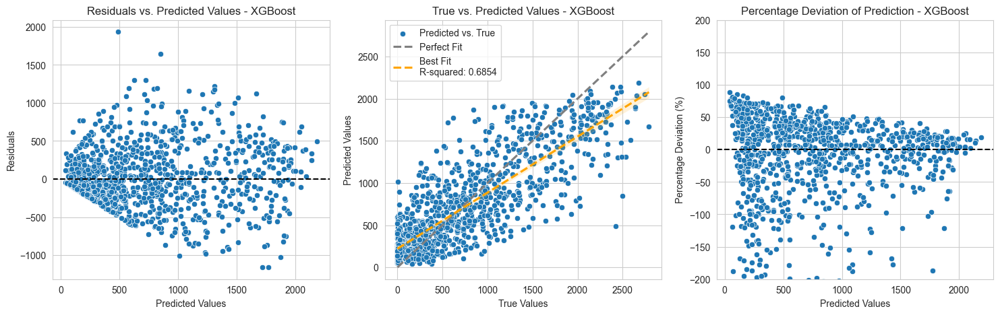

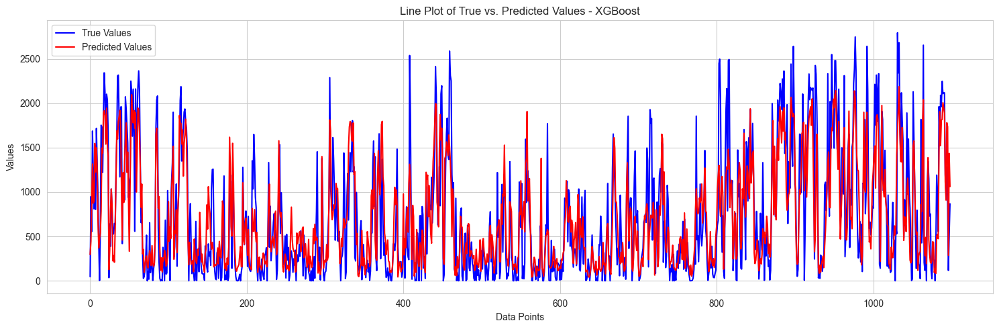

In [144]:
analyze_predictions(Y_test, Y_test_hat, model='XGBoost')

## **Final Model HPO**

In this section we are going to carry out an HPO of the final model using all the available data.

In [153]:
preprocessing_grid = {'imputation': [params_final_model['imputation']], 
                      'feature_engineering': [params_final_model['feature_engineering']], 
                      'only_sotavento': [params_final_model['only_sotavento']], 
                      'only_wind': [params_final_model['only_wind']]}

def model_param_optuna(trial):
    return {'estimator__n_estimators': trial.suggest_int('estimator__n_estimators', 5, 180),
            'estimator__max_depth': trial.suggest_int('estimator__max_depth', 1, 8),
            'estimator__eta': trial.suggest_float('estimator__eta', 0, 0.3, step=0.02, log=False),
            'estimator__alpha': trial.suggest_float('estimator__alpha', 0.2, 1, step=0.01, log=False),
            'estimator__lambda': trial.suggest_float('estimator__lambda', 1, 5, step=0.04, log=False),
            'estimator__subsample': trial.suggest_float('estimator__subsample', 0.3, 1, step=0.01, log=False),
            'estimator__gamma': trial.suggest_float('estimator__gamma', 0, 7, step=0.05, log=False),
            'estimator__colsample_bytree': trial.suggest_float('estimator__colsample_bytree', 0.3, 1, step=0.02, log=False)}


search_methods_grid = ['optuna']

xgb_global_search_ = global_search(model=XGBRegressor(objective='reg:squarederror', booster='gbtree', random_state=123),
                                   preprocessing_grid=preprocessing_grid, 
                                   model_param_grid_search=None,
                                   model_param_random_search=None,
                                   model_param_halving_search=None, 
                                   model_param_optuna = model_param_optuna,
                                   search_methods_grid=search_methods_grid,
                                   cv_method='years_based', score='neg_mean_absolute_error',
                                   n_iter=200, seed=123, 
                                   X_years=X_years, years_training=[2005, 2006, 2007], years_testing=[2008, 2009])

xgb_global_search_.fit(X, Y)
# Time: 90 mins

[I 2024-01-05 19:47:11,804] A new study created in memory with name: no-name-beb1532e-b4a0-44fe-8181-63680239cd23


imputation: iterative_median , feature_engineering: True , only_sotavento: False , only_wind: False , search_method: optuna


c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 19:47:34,754] Trial 0 finished with value: -284.44386607481636 and parameters: {'estimator__n_estimators': 127, 'estimator__max_depth': 3, 'estimator__eta': 0.06, 'estimator__alpha': 0.64, 'estimator_lambda': 3.88, 'estimator__subsample': 0.6, 'estimator__gamma': 6.9, 'estimator__colsample_bytree': 0.78}. Best is trial 0 with value: -284.44386607481636.
c:\Users\fscielzo\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\impute\_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
[I 2024-01-05 19:47:58,133] Trial 1 finished with value: -283.8173677756854 and parameters: {'estimator__n_estimators': 89, 'estimator__max_depth': 4, 'estimator__eta': 0.1, 'estimator__alpha': 0.79, 'estimator_lambda': 2.

The obtained MAE is:

In [154]:
xgb_global_search_.best_score_

274.78670631721087

The winner combination of hyperparameters is:

In [155]:
params_final_model = xgb_global_search_.best_params_
params_final_model

{'imputation': 'iterative_median',
 'feature_engineering': True,
 'only_sotavento': False,
 'only_wind': False,
 'estimator__n_estimators': 142,
 'estimator__max_depth': 7,
 'estimator__eta': 0.04,
 'estimator__alpha': 0.5,
 'estimator_lambda': 2.56,
 'estimator__subsample': 0.5,
 'estimator__gamma': 3.0500000000000003,
 'estimator__colsample_bytree': 0.8200000000000001}

## **Saving the competition model**

The final model with the last hyperparameter combination is our model for the competition. Now we are going to save it as a pre-trained model, ready to make prediction on new data.

In [158]:
model = XGBRegressor(objective='reg:squarederror', booster='gbtree', random_state=123,
                     n_estimators=params_final_model['estimator__n_estimators'],
                     max_depth=params_final_model['estimator__max_depth'],
                     eta=params_final_model['estimator__eta'], 
                     alpha=params_final_model['estimator__alpha'], 
                     reg_lambda=params_final_model['estimator_lambda'],
                     subsample=params_final_model['estimator__subsample'] ,
                     gamma=params_final_model['estimator__gamma'] ,
                     colsample_bytree=params_final_model['estimator__colsample_bytree'])

pipeline = Pipeline([('imputation', imputation()),
                     ('feature_engineering', feature_engineering()),
                     ('only_wind', only_wind()),
                     ('only_sotavento', only_sotavento()), 
                     ('estimator', model) 
                    ])

pipeline.fit(X=X, y=Y)

Pipeline(steps=[('imputation', imputation()),
                ('feature_engineering', feature_engineering()),
                ('only_wind', only_wind()),
                ('only_sotavento', only_sotavento()),
                ('estimator',
                 XGBRegressor(alpha=0.5, base_score=None, booster='gbtree',
                              callbacks=None, colsample_bylevel=None,
                              colsample_bynode=None,
                              colsample_bytree=0.8200000000000001, device=None,
                              early_stopping_rounds...
                              eval_metric=None, feature_types=None,
                              gamma=3.0500000000000003, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=7, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=142, n_jobs=None, ...))])

**Saving the pre-trained model:**

In [161]:
joblib.dump(pipeline, "competition_model.joblib")

['competition_model.joblib']

**Loading the pre-trained model:**

In [162]:
competition_model = joblib.load("results/competition_model.joblib")

## **Making prediction for compatition data**

Now we will use our pre-trained model to make predictions for the competition data.

In [177]:
with gzip.open('data/wind_competition.csv.gzip', 'rt') as f:
    wind_comp_df = pd.read_csv(f)
    
wind_comp_df = pl.from_pandas(wind_comp_df)

In [181]:
competition_model.predict(wind_comp_df[predictors])

array([695.9338  , 155.75926 , 851.264   , ..., 224.28133 ,  54.96442 ,
        53.400623], dtype=float32)

In [185]:
competition_predictions = pl.from_numpy(competition_model.predict(wind_comp_df[predictors]))
competition_predictions.columns = ['Y_hat']
competition_predictions

Y_hat
f32
695.933777
155.759262
851.263977
500.337463
413.18222
422.073273
968.531677
1267.982178
1589.704834


In [187]:
competition_predictions.write_csv('competition_predictions.csv')